This notebook serves Chapters 2, 3, 4, 7, 8, 9 in the book of "Modern Time Series Forecasting Techniques
For Predictive Analytics and Anomaly Detection" by Kuo, C.

## NeuralProphet I

#### Software requirement

In [14]:
pip install --upgrade pip 
!pip install neuralprophet 
!pip install ipywidgets>=7.0.0

zsh:1: 7.0.0 not found


#### Do the following if you use Google colab:

In [ ]:
#!pip install neuralprophet
# neuralprophet does not work with colab unless numpy1.23.5: https://github.com/googlecolab/colabtools/issues/3752
!pip uninstall numpy
!pip install git+https://github.com/ourownstory/neural_prophet.git numpy==1.25.0

  Cloning https://github.com/ourownstory/neural_prophet.git to /tmp/pip-req-build-s_swq_tp
  Running command git clone --filter=blob:none --quiet https://github.com/ourownstory/neural_prophet.git /tmp/pip-req-build-s_swq_tp
  Resolved https://github.com/ourownstory/neural_prophet.git to commit 23543560b4ed278e84d1fd0f119d332342336d0d
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 55.1 MB/s eta 0:00:00
  Using cached kaleido-0.2.1-py2.py3-none-manylinux1_x86_64.whl (79.9 MB)
  Created wheel for neuralprophet: filename=neuralprophet-1.0.0rc10-py3-none-any.whl size=145405 sha256=b79cf859e17277753c22f91c21238f592f5d24aa581d47e4f38d7f733ac5cf77
  Stored in directory: /tmp/pip-ephem-wheel-cache-ycpetyme/wheels/32/ce/37/d289cb9c67e62f7912fc3a25e624277ea47902c32e24371a78
Successfully built neuralprophet
  Attempting uninstall: neuralprophet
    Foun

In [2]:
from neuralprophet import set_random_seed
set_random_seed(0)

/Users/chriskuo/anaconda3/envs/time_series/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
%matplotlib inline
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
import logging
import warnings
logging.getLogger('prophet').setLevel(logging.ERROR)
warnings.filterwarnings("ignore")

## Data preparation

In [ ]:
# If you use Google Colab, use the following:
from google.colab import drive
drive.mount('/content/gdrive')

path = '/content/gdrive/My Drive/data/time_series'
data = pd.read_csv(path + '/bike_sharing_daily.csv')
# convert string to datetime64
data["ds"] = pd.to_datetime(data["dteday"])
data.tail()

Mounted at /content/gdrive


In [4]:
# If you use your local computer, use this. You will need to download the data to your local folder.
path = '/Users/chriskuo/Documents/Documents/My_documents_all/Book_neural_network_time_series_anomaly_detection/data'
data = pd.read_csv(path + '/bike_sharing_daily.csv')
# convert string to datetime64
data["ds"] = pd.to_datetime(data["dteday"])
data.tail()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,ds
726,727,12/27/12,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114,2012-12-27
727,728,12/28/12,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095,2012-12-28
728,729,12/29/12,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341,2012-12-29
729,730,12/30/12,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796,2012-12-30
730,731,12/31/12,1,1,12,0,1,1,2,0.215833,0.223487,0.577500,0.154846,439,2290,2729,2012-12-31


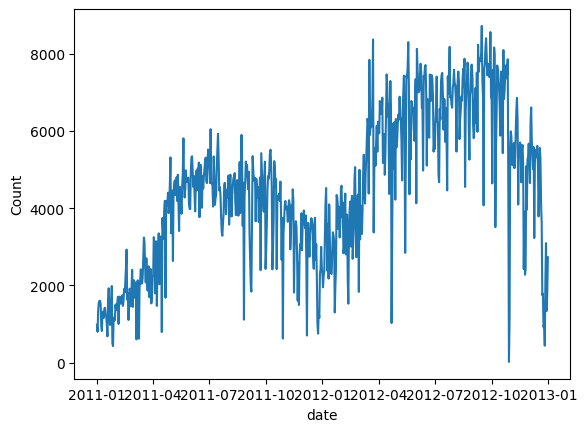

In [5]:
# create line plot of sales data
plt.plot(data['ds'], data["cnt"])
plt.xlabel("date")
plt.ylabel("Count")
plt.show()

In [6]:
df = data[['ds','cnt']]
df.columns = ['ds','y']

## Modeling with NeuralProphet

In [16]:
from neuralprophet import NeuralProphet, set_log_level

# Disable logging messages unless there is an error
set_log_level("ERROR")

# Create a NeuralProphet model with default parameters
m = NeuralProphet()

# Fit the model
metrics = m.fit(df)

Finding best initial lr: 100%|██████████| 222/222 [00:00<00:00, 543.79it/s]


Epoch 130: 100%|██████████| 130/130 [00:00<00:00, 4320.36it/s, loss=0.0208, v_num=120, MAE=681.0, RMSE=936.0, Loss=0.0206, RegLoss=0.000]   


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 807.06it/s]


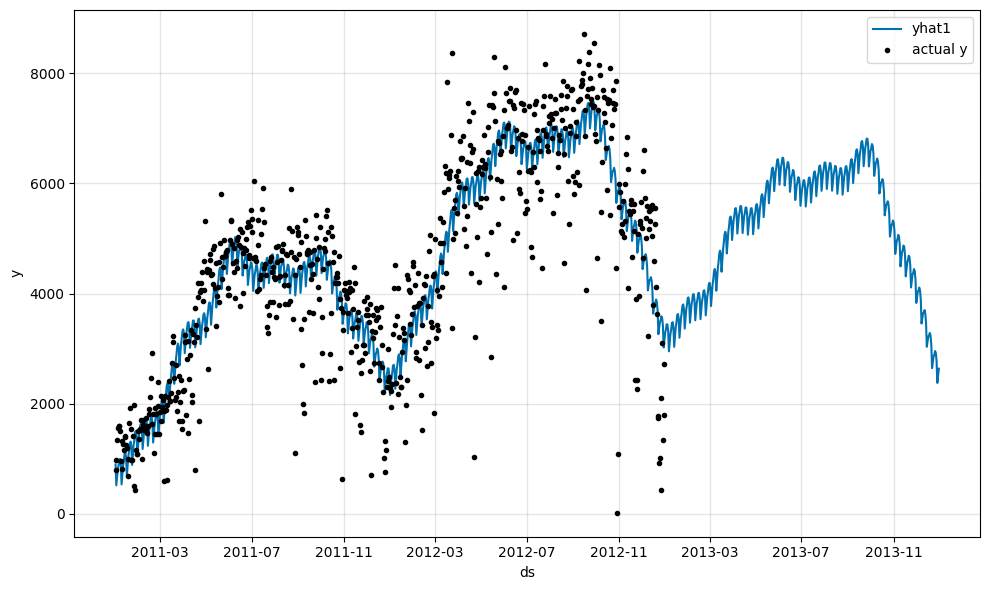

In [17]:
# Create a new dataframe reaching 365 into the future for our forecast, n_historic_predictions also shows historic data
df_future = m.make_future_dataframe(df, 
              n_historic_predictions=True, 
              periods=365)

# Predict the future
forecast = m.predict(df_future)
m.set_plotting_backend("matplotlib")  # Use matplotlib

# Visualize the forecast
m.plot(forecast)

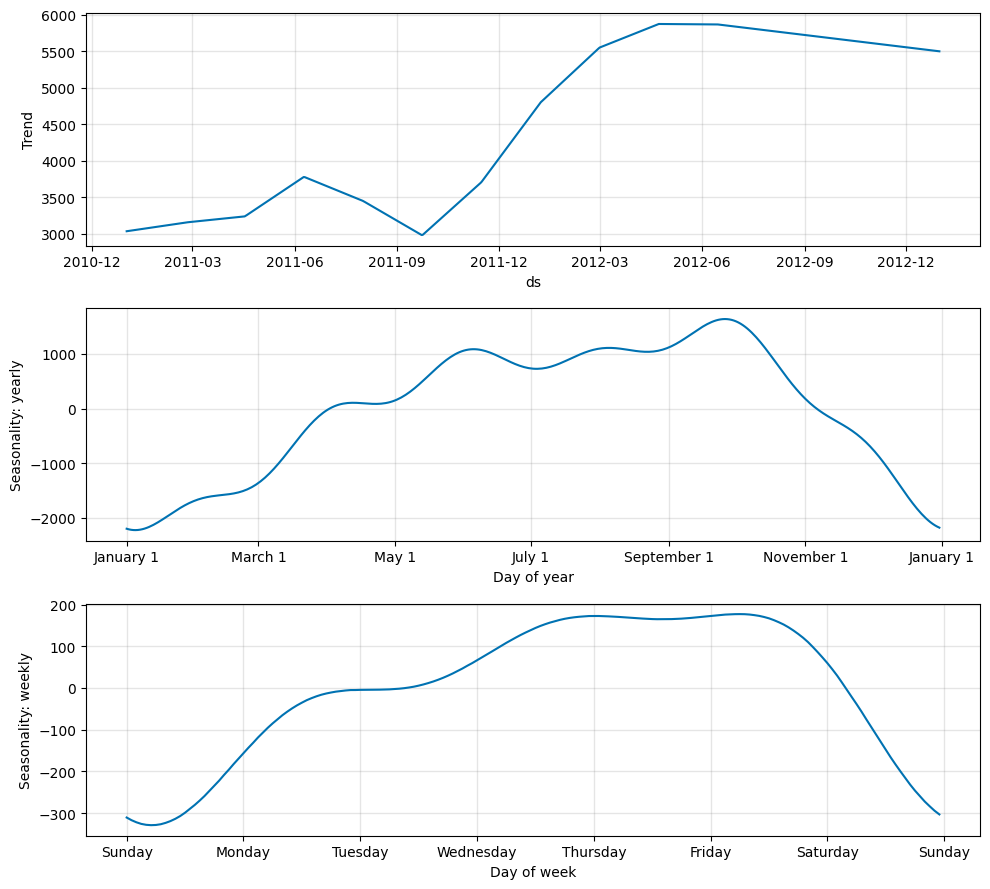

In [18]:
m.plot_parameters(components=["trend", "seasonality"])

## Trend

### Trend experiment 1: No change point

Finding best initial lr: 100%|██████████| 222/222 [00:00<00:00, 1026.56it/s]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 635.31it/s]


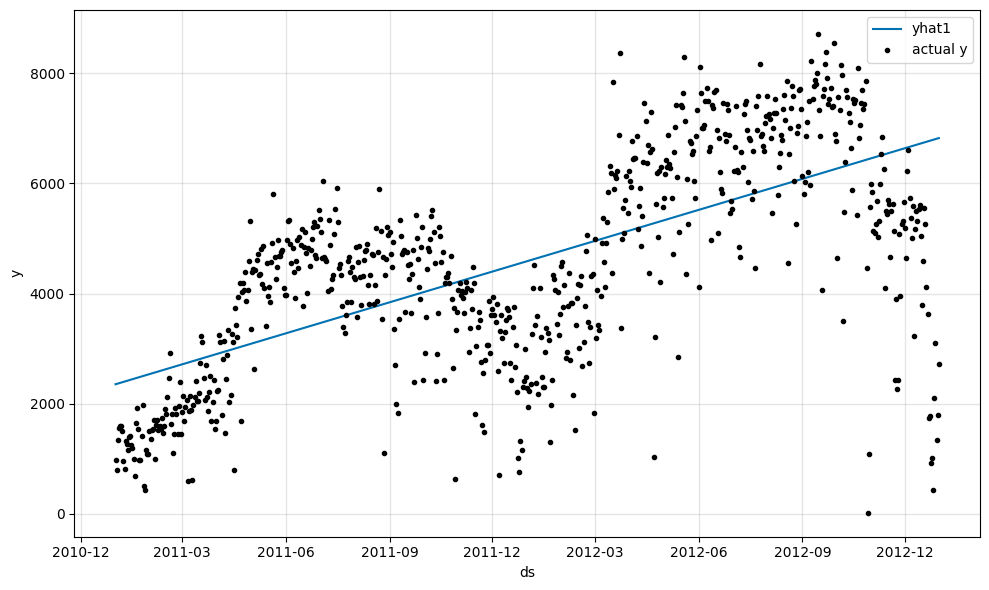

In [19]:
# Model and prediction
m = NeuralProphet(
    # Disable change trendpoints
    n_changepoints=0,
    # Disable seasonality components
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
)
m.set_plotting_backend("matplotlib")
metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

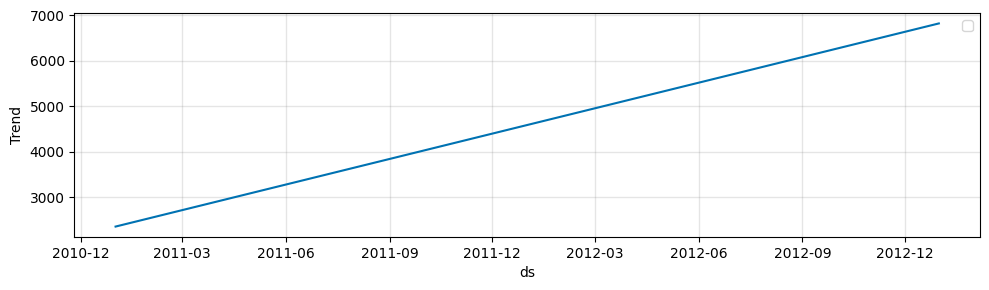

In [20]:
m.plot_components(forecast, components=["trend"])

Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 789.59it/s]


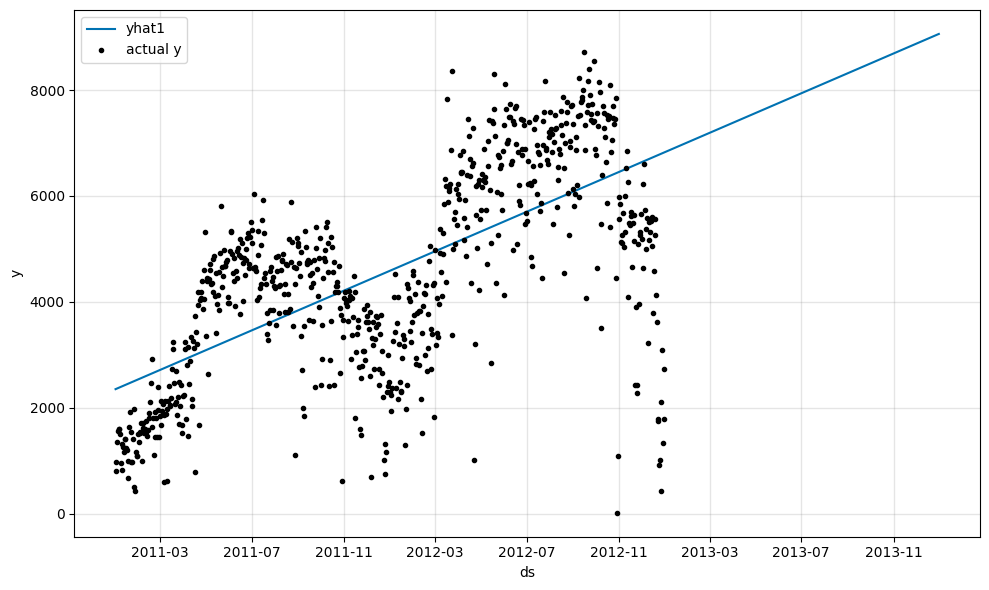

In [21]:
df_future = m.make_future_dataframe(df, periods=365, n_historic_predictions=True)

# Predict the future
forecast = m.predict(df_future)

# Visualize the forecast
m.plot(forecast)

In [22]:
metrics.tail()

,MAE,RMSE,Loss,RegLoss,epoch
125,1221.012329,1495.261597,0.049332,0.0,125
126,1218.805420,1495.490479,0.049112,0.0,126
127,1219.883545,1492.417603,0.049054,0.0,127
128,1222.162354,1497.670532,0.049358,0.0,128
129,1219.975342,1497.860352,0.049207,0.0,129


### In-time and out-of-time data split

In [23]:
# Model and prediction
m = NeuralProphet(
    # Disable change trendpoints
    n_changepoints=0,
    # Disable seasonality components
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
)
df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 1054.87it/s]


Epoch 1:   1%|          | 1/130 [00:00<00:00, 2709.50it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   2%|▏         | 2/130 [00:00<00:00, 4148.67it/s, loss=0.101, v_num=122, MAE_val=3.95e+3, RMSE_val=4.55e+3, Loss_val=0.430, RegLoss_val=0.000, MAE=1.57e+3, RMSE=1.97e+3, Loss=0.103, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/130 [00:00<00:00, 6948.05it/s, loss=0.094, v_num=122, MAE_val=3.73e+3, RMSE_val=4.36e+3, Loss_val=0.400, RegLoss_val=0.000, MAE=1.47e+3, RMSE=1.86e+3, Loss=0.0922, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/130 [00:00<00:00, 7752.87it/s, loss=0.084, v_num=122, MAE_val=3.5e+3, RMSE_val=4.16e+3, Loss_val=0.370, RegLoss_val=0.000, MAE=1.39e+3, RMSE=1.77e+3, Loss=0.0834, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▍         | 5/130 [00:00<00:00, 8619.61it/s, loss=0.0755, v_num=122, MAE_val=3.26e+3, RMSE_val=3.96e+3, Loss_val=0.340, RegLoss_val=0.000, MAE=1.3e+3, RMSE=1.67e+3, Loss=0.0748, RegLos

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
125,1738.624756,2350.300049,0.141998,0.0,125,1074.996948,1290.417236,0.044717,0.0
126,1739.159424,2351.658447,0.142124,0.0,126,1069.651733,1280.422852,0.044474,0.0
127,1739.385010,2352.231445,0.142177,0.0,127,1104.078369,1316.882202,0.047637,0.0
128,1739.415039,2352.320801,0.142185,0.0,128,1079.765259,1282.999390,0.045154,0.0
129,1739.446045,2352.403076,0.142193,0.0,129,1070.316772,1288.859741,0.044700,0.0


### Trend experiment 2: automatic change point detection

Finding best initial lr: 100%|██████████| 222/222 [00:00<00:00, 947.13it/s]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 665.34it/s]


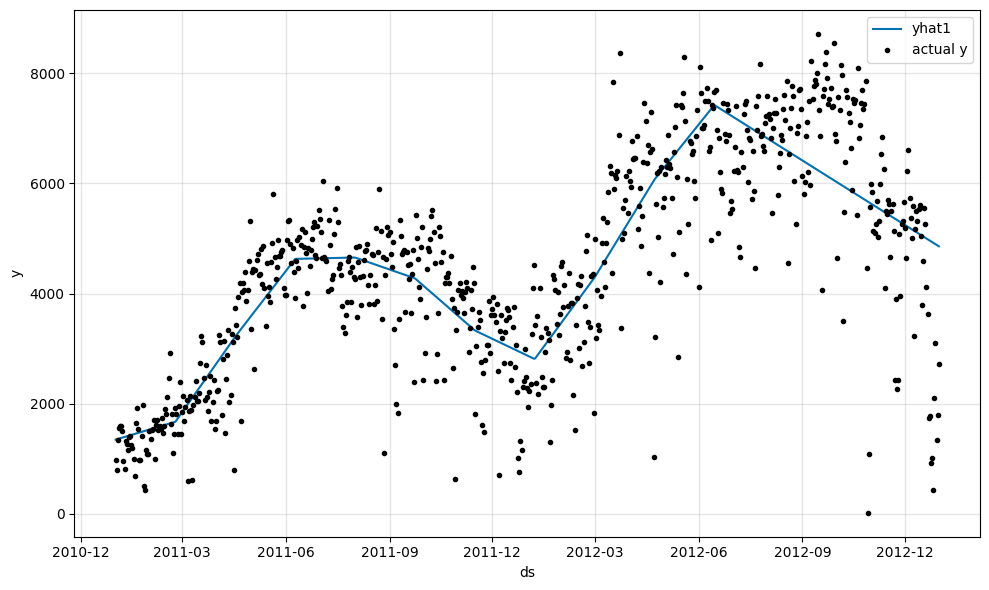

In [24]:
# Model and prediction
m = NeuralProphet(
    # Use the default number of change trend points (10)
    # n_changepoints=0,
    # Disable seasonality components
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
)
m.set_plotting_backend("matplotlib")  # Use matplotlib due to #1235
metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

In [25]:
metrics.tail()

,MAE,RMSE,Loss,RegLoss,epoch
125,753.233948,1037.007080,0.026490,0.0,125
126,754.854431,1045.074829,0.026552,0.0,126
127,757.429504,1046.634033,0.026674,0.0,127
128,756.085144,1047.750732,0.026557,0.0,128
129,757.385681,1040.849243,0.026638,0.0,129


## Understanding the seasonality module

###  Modeling with seasonality + trend with no change point

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 853.76it/s]


Epoch 1:   1%|          | 1/130 [00:00<00:00, 2707.75it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   2%|▏         | 2/130 [00:00<00:00, 4725.98it/s, loss=0.76, v_num=124, MAE_val=5.01e+3, RMSE_val=6.05e+3, Loss_val=0.595, RegLoss_val=0.000, MAE=6.14e+3, RMSE=7.43e+3, Loss=0.564, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/130 [00:00<00:00, 8930.38it/s, loss=0.486, v_num=124, MAE_val=4.46e+3, RMSE_val=5.41e+3, Loss_val=0.516, RegLoss_val=0.000, MAE=5.3e+3, RMSE=6.45e+3, Loss=0.472, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/130 [00:00<00:00, 9576.04it/s, loss=0.389, v_num=124, MAE_val=3.88e+3, RMSE_val=4.77e+3, Loss_val=0.434, RegLoss_val=0.000, MAE=4.5e+3, RMSE=5.47e+3, Loss=0.380, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▍         | 5/130 [00:00<00:00, 11625.01it/s, loss=0.301, v_num=124, MAE_val=3.35e+3, RMSE_val=4.23e+3, Loss_val=0.359, RegLoss_val=0.000, MAE=3.75e+3, RMSE=4.58e+3, Loss=0.304, RegLoss=0.

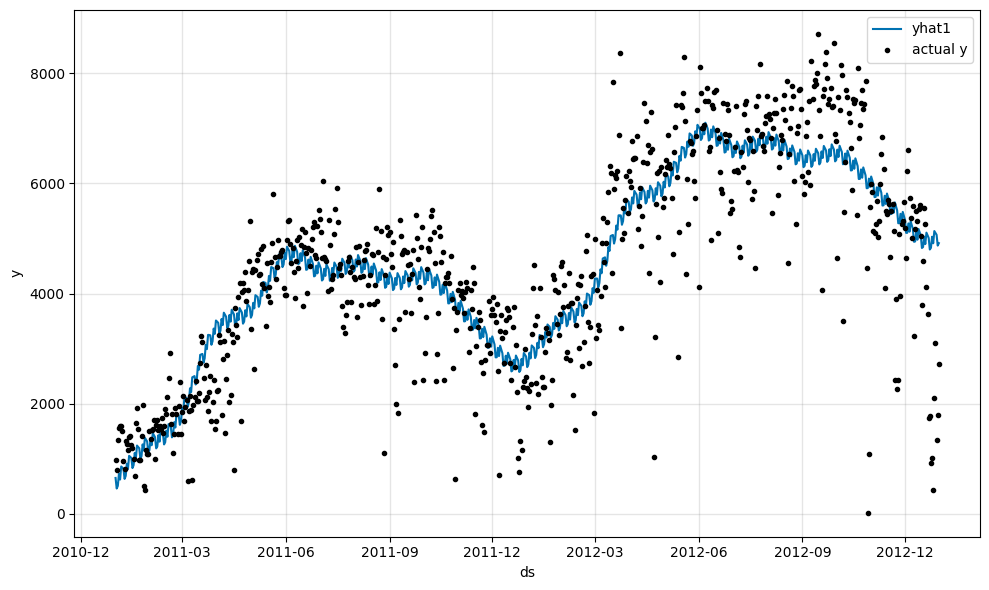

In [26]:
# Model and prediction
m = NeuralProphet(
    # Disable trend changepoints
    n_changepoints=0,
    # Enable all seasonality components
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
)
df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")

m.set_plotting_backend("matplotlib")
forecast = m.predict(df)
m.plot(forecast)

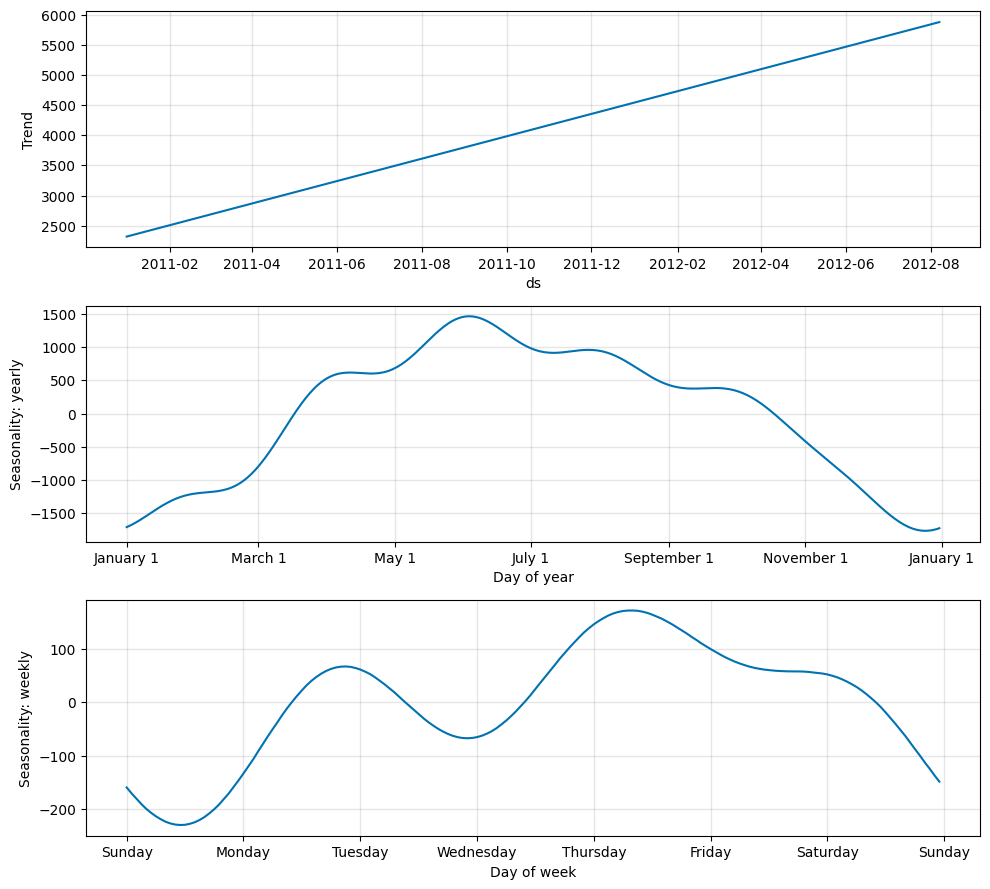

In [27]:
m.plot_parameters(components=["trend", "seasonality"])

In [28]:
metrics.tail()

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
125,1105.109009,1512.240112,0.069771,0.0,125,645.518982,852.452820,0.020687,0.0
126,1105.221924,1512.616577,0.069779,0.0,126,643.196777,843.040283,0.020156,0.0
127,1103.127563,1509.902954,0.069592,0.0,127,643.612610,845.080322,0.020263,0.0
128,1103.650635,1510.187744,0.069614,0.0,128,648.955933,853.226379,0.020460,0.0
129,1103.768677,1511.491699,0.069651,0.0,129,633.013733,830.576111,0.019895,0.0


###  Modeling with seasonality + trend with change points

In [29]:
# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
)
m.set_plotting_backend("matplotlib")  # Use matplotlib

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 573.21it/s]


Epoch 1:   1%|          | 1/130 [00:00<00:00, 2908.67it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   2%|▏         | 2/130 [00:00<00:00, 5387.67it/s, loss=0.964, v_num=125, MAE_val=9.37e+3, RMSE_val=1.09e+4, Loss_val=1.230, RegLoss_val=0.000, MAE=8.73e+3, RMSE=1.03e+4, Loss=0.854, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/130 [00:00<00:00, 8360.74it/s, loss=0.725, v_num=125, MAE_val=7.95e+3, RMSE_val=9.35e+3, Loss_val=1.020, RegLoss_val=0.000, MAE=7.6e+3, RMSE=9.02e+3, Loss=0.733, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/130 [00:00<00:00, 10022.23it/s, loss=0.616, v_num=125, MAE_val=6.48e+3, RMSE_val=7.71e+3, Loss_val=0.803, RegLoss_val=0.000, MAE=6.49e+3, RMSE=7.73e+3, Loss=0.604, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▍         | 5/130 [00:00<00:00, 12897.61it/s, loss=0.48, v_num=125, MAE_val=5.05e+3, RMSE_val=6.17e+3, Loss_val=0.601, RegLoss_val=0.000, MAE=5.23e+3, RMSE=6.35e+3, Loss=0.465, RegLoss=

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
125,1097.453125,1500.562012,0.068562,0.0,125,617.340271,825.976746,0.019426,0.0
126,1096.832886,1501.086792,0.068575,0.0,126,624.109863,833.132141,0.020110,0.0
127,1099.372314,1504.076172,0.068778,0.0,127,627.869629,835.841003,0.020405,0.0
128,1101.253052,1504.702881,0.068893,0.0,128,618.696777,830.506042,0.019425,0.0
129,1101.619507,1503.217407,0.068818,0.0,129,623.577332,843.939148,0.020528,0.0


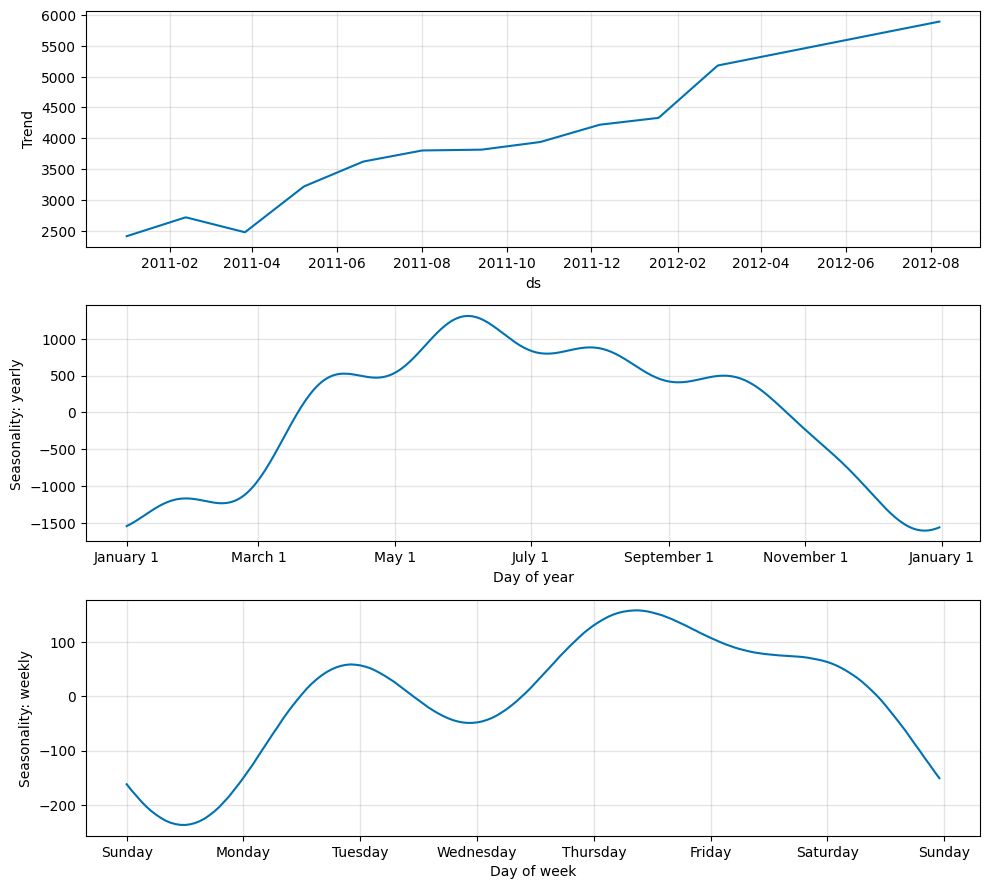

In [30]:
m.plot_parameters(components=["trend", "seasonality"])

## Trend + Seasonality + Holidays & Events

In [31]:
# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=True,
)
m = m.add_country_holidays("US")

m.set_plotting_backend("matplotlib")  # Use matplotlib

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 715.68it/s]


Epoch 1:   1%|          | 1/130 [00:00<00:00, 2321.14it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   2%|▏         | 2/130 [00:00<00:00, 3110.35it/s, loss=0.481, v_num=126, MAE_val=4.62e+3, RMSE_val=5.88e+3, Loss_val=0.538, RegLoss_val=0.000, MAE=4e+3, RMSE=4.9e+3, Loss=0.342, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/130 [00:00<00:00, 6263.27it/s, loss=0.283, v_num=126, MAE_val=4.3e+3, RMSE_val=5.52e+3, Loss_val=0.493, RegLoss_val=0.000, MAE=3.43e+3, RMSE=4.23e+3, Loss=0.282, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/130 [00:00<00:00, 10817.03it/s, loss=0.224, v_num=126, MAE_val=3.85e+3, RMSE_val=4.99e+3, Loss_val=0.428, RegLoss_val=0.000, MAE=2.92e+3, RMSE=3.67e+3, Loss=0.228, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▍         | 5/130 [00:00<00:00, 14122.24it/s, loss=0.174, v_num=126, MAE_val=3.55e+3, RMSE_val=4.63e+3, Loss_val=0.384, RegLoss_val=0.000, MAE=2.39e+3, RMSE=3.01e+3, Loss=0.175, RegLoss=0.0

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
125,1109.304321,1495.709839,0.069902,0.0,125,613.446350,817.363403,0.019072,0.0
126,1110.051025,1496.880737,0.069992,0.0,126,594.198242,803.838745,0.018403,0.0
127,1110.580322,1497.563843,0.070047,0.0,127,602.040222,809.840454,0.018846,0.0
128,1108.636597,1498.202271,0.069989,0.0,128,585.111877,792.350769,0.018167,0.0
129,1112.925293,1499.635742,0.070247,0.0,129,591.844482,794.994324,0.018371,0.0


## Custom events

In [32]:
df_events = pd.DataFrame(
    {
        "event": "special_events",
        "ds": pd.to_datetime(
            [
                "2018-11-23",
                "2018-11-17",
                "2018-04-11",
            ]
        ),
    }
)

# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False
)
m = m.add_country_holidays("US")

m.add_events("special_events")

df_all = m.create_df_with_events(df, df_events)

m.set_plotting_backend("matplotlib")  # Use matplotlib

df_train, df_test = m.split_df(df_all, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 755.83it/s]


Epoch 1:   1%|          | 1/130 [00:00<00:00, 3449.26it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   2%|▏         | 2/130 [00:00<00:00, 6096.37it/s, loss=1.28, v_num=127, MAE_val=1.83e+4, RMSE_val=1.92e+4, Loss_val=2.530, RegLoss_val=0.000, MAE=1.11e+4, RMSE=1.26e+4, Loss=1.190, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/130 [00:00<00:00, 8450.58it/s, loss=1.01, v_num=127, MAE_val=1.67e+4, RMSE_val=1.76e+4, Loss_val=2.300, RegLoss_val=0.000, MAE=9.58e+3, RMSE=1.11e+4, Loss=1.020, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/130 [00:00<00:00, 11110.74it/s, loss=0.866, v_num=127, MAE_val=1.51e+4, RMSE_val=1.6e+4, Loss_val=2.050, RegLoss_val=0.000, MAE=8.43e+3, RMSE=9.79e+3, Loss=0.888, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▍         | 5/130 [00:00<00:00, 12953.38it/s, loss=0.719, v_num=127, MAE_val=1.32e+4, RMSE_val=1.43e+4, Loss_val=1.790, RegLoss_val=0.000, MAE=6.8e+3, RMSE=8.1e+3, Loss=0.692, RegLoss=0.0

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
125,1095.663086,1414.210083,0.064179,0.0,125,596.499207,805.329285,0.018639,0.0
126,1096.864746,1414.422974,0.064220,0.0,126,595.949707,804.948059,0.018674,0.0
127,1096.144409,1415.270508,0.064287,0.0,127,594.394165,802.348877,0.018524,0.0
128,1096.887573,1414.010010,0.064237,0.0,128,589.158813,804.231567,0.018516,0.0
129,1098.992920,1414.923950,0.064365,0.0,129,598.483826,811.593567,0.018923,0.0


# NeuralProphet II

## Auto-regression

### The AR module of NeuralProphet
Now we add autoregression to our model with the n_lags parameter.

In [67]:
# Model and prediction
m = NeuralProphet(
    # Disable trend changepoints
    n_changepoints=0,
    # Disable seasonality components
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
)
m.set_plotting_backend("matplotlib")  # Use matplotlib

metrics = m.fit(df)
forecast = m.predict(df)

Finding best initial lr: 100%|██████████| 222/222 [00:00<00:00, 921.42it/s]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 697.42it/s]


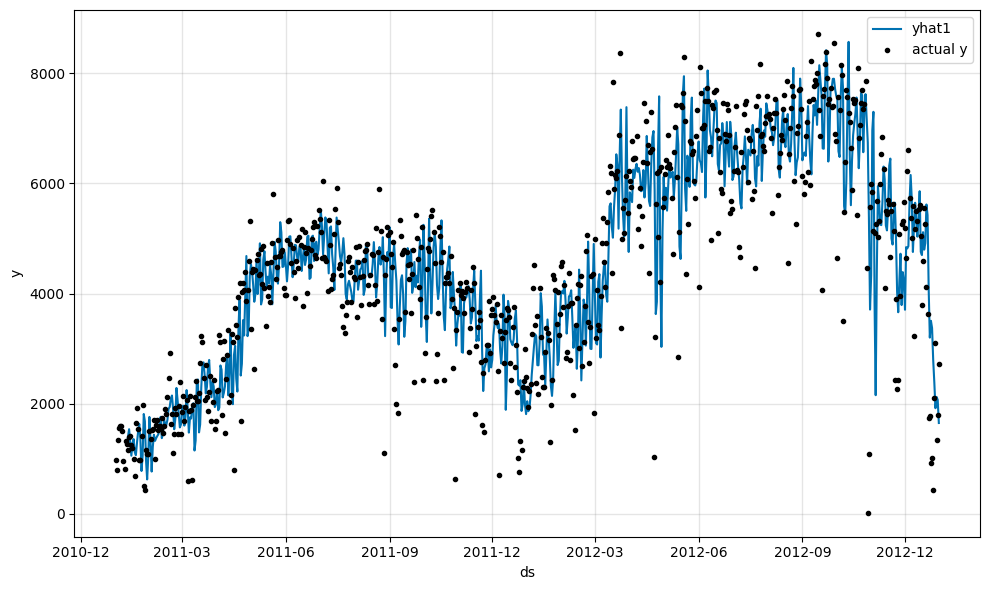

In [34]:
m.plot(forecast)

We have limited the change point to zero. Let's check if the trend is a straight line.

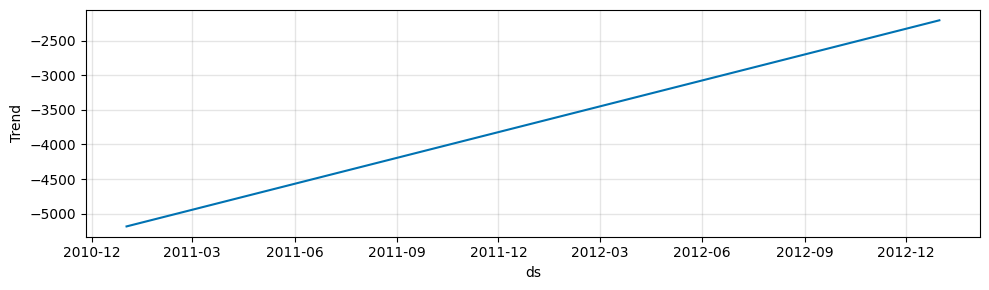

In [35]:
m.plot_parameters(components=["trend"])

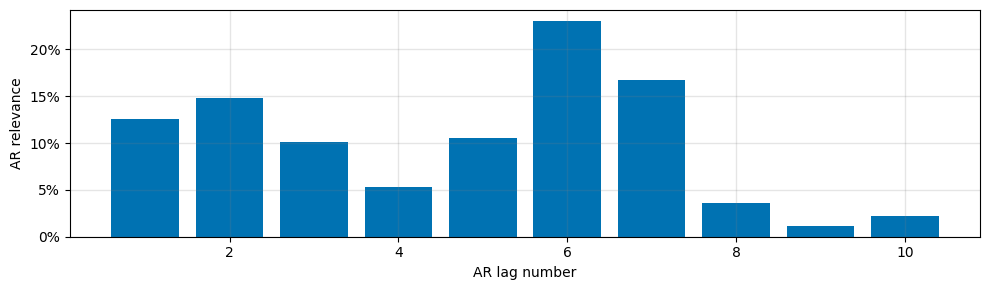

In [36]:
m.plot_parameters(components=["autoregression"])

In [37]:
metrics.tail()

,MAE,RMSE,Loss,RegLoss,epoch
125,754.606934,1016.664734,0.024361,0.0,125
126,754.839600,1021.394104,0.024425,0.0,126
127,753.865723,1023.899231,0.024258,0.0,127
128,757.963074,1018.142517,0.024599,0.0,128
129,755.504150,1021.003906,0.024435,0.0,129


## Trend + Seasonability + holidays + Auto-regressive

In [68]:
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level

In [69]:
df = data[['ds','cnt']]
df.columns = ['ds','y']

Finding best initial lr: 100%|██████████| 222/222 [00:00<00:00, 747.41it/s]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 252.27it/s]


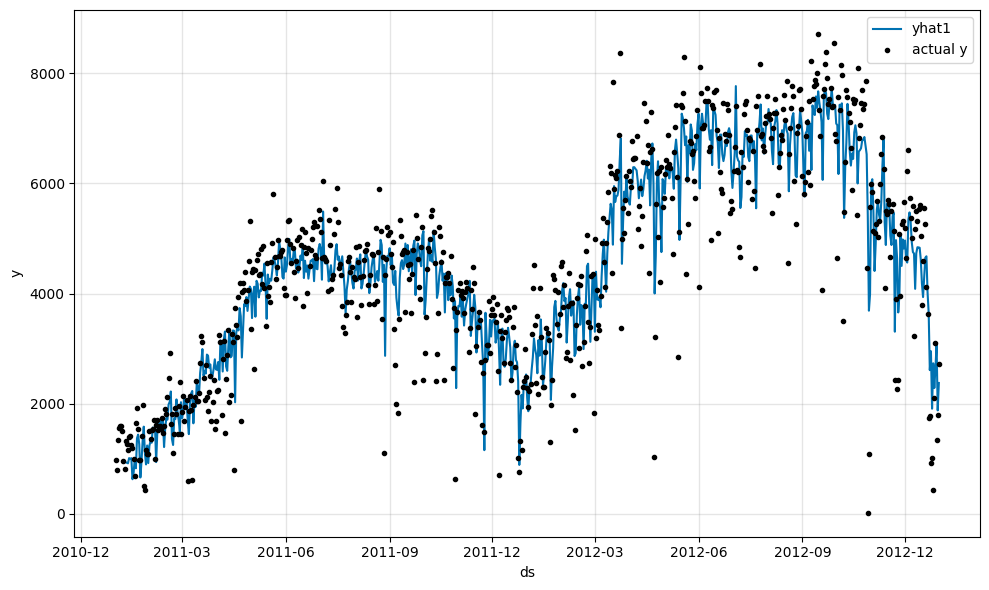

In [71]:
# Model and prediction
m = NeuralProphet(
    # Let NeuralProphet detection change points automatically
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10
)
m.set_plotting_backend("matplotlib")  # Use matplotlib

m = m.add_country_holidays("US")

metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

In [72]:
forecast.tail()

,ds,y,yhat1,ar1,trend,season_yearly,season_weekly,events_additive,event_Christmas Day,event_Christmas Day (observed),...,event_Independence Day,event_Labor Day,event_Martin Luther King Jr. Day,event_Memorial Day,event_New Year's Day,event_New Year's Day (observed),event_Thanksgiving,event_Veterans Day,event_Veterans Day (observed),event_Washington's Birthday
726,2012-12-27,2114,2286.898438,-1289.324219,5800.862305,-2417.477051,192.837708,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
727,2012-12-28,3095,2651.142578,-861.690308,5799.649902,-2444.733398,157.916565,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
728,2012-12-29,1341,3073.807373,-343.791962,5798.437500,-2467.469482,86.631203,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
729,2012-12-30,1796,1881.263428,-1126.282349,5797.225098,-2485.542725,-304.136566,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
730,2012-12-31,2729,2378.296143,-767.546204,5796.012207,-2498.878906,-151.291229,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [73]:
forecast.columns

Index(['ds', 'y', 'yhat1', 'ar1', 'trend', 'season_yearly', 'season_weekly',
       'events_additive', 'event_Christmas Day',
       'event_Christmas Day (observed)', 'event_Columbus Day',
       'event_Independence Day', 'event_Labor Day',
       'event_Martin Luther King Jr. Day', 'event_Memorial Day',
       'event_New Year's Day', 'event_New Year's Day (observed)',
       'event_Thanksgiving', 'event_Veterans Day',
       'event_Veterans Day (observed)', 'event_Washington's Birthday'],
      dtype='object')

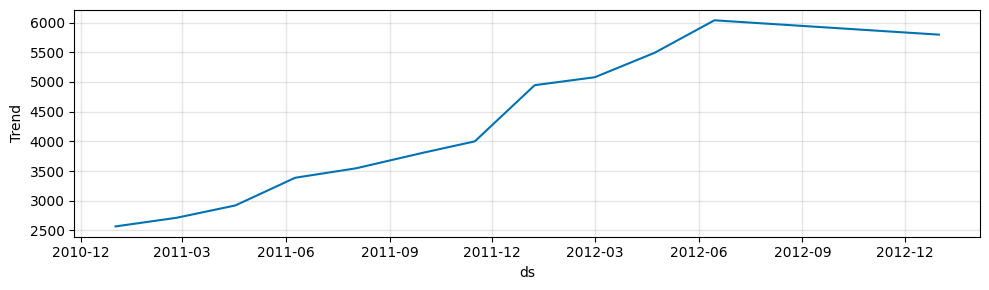

In [74]:
m.plot_parameters(components=["trend"])

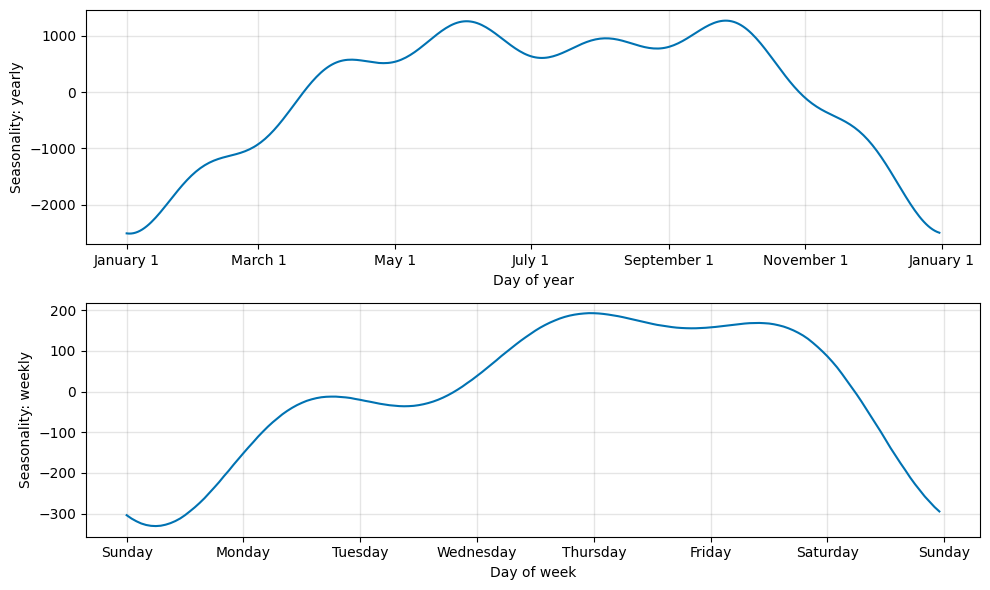

In [75]:
m.plot_parameters(components=["seasonality"])

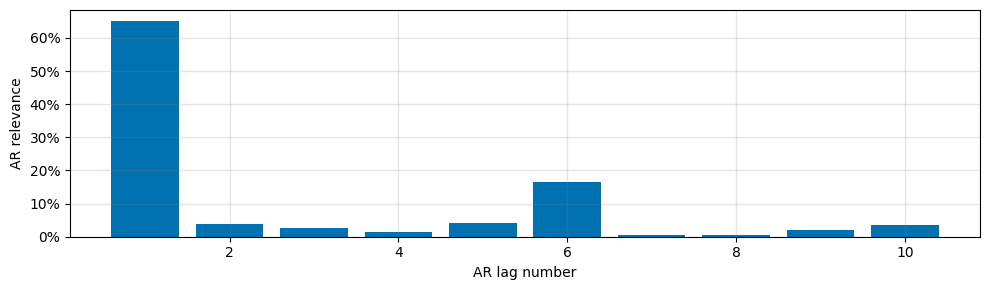

In [76]:
m.plot_parameters(components=["autoregression"])

In [77]:
df_future = m.make_future_dataframe(df, n_historic_predictions=True, periods=365)
df_future.shape

(732, 2)

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 161.45it/s]


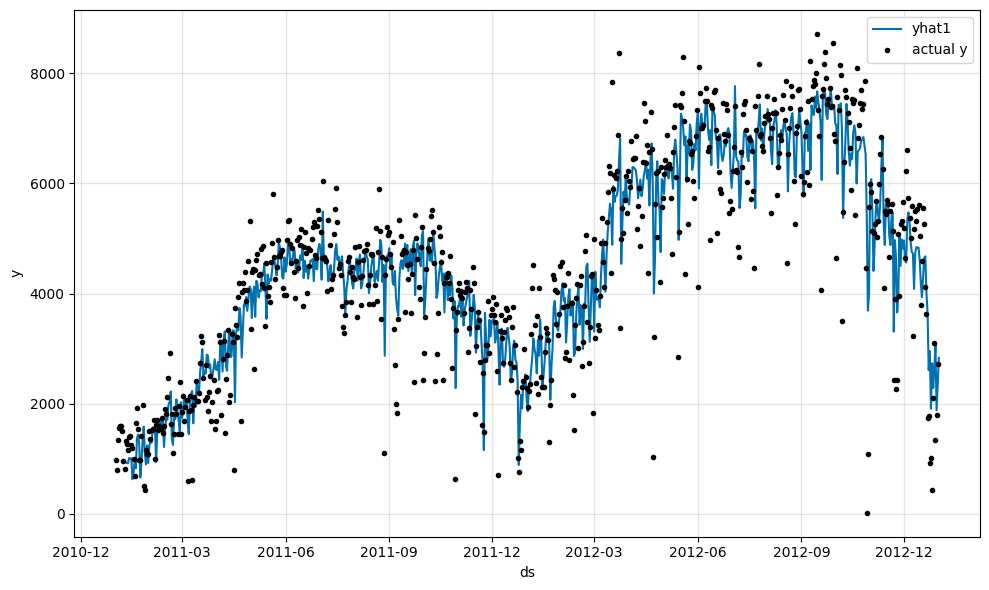

In [78]:
# Predict the future
forecast = m.predict(df_future)

# Visualize the forecast
m.plot(forecast)

In [79]:
# Predict the future
forecast = m.predict(df_future)
[df.shape, df_future.shape]

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 242.82it/s]


[(731, 2), (732, 2)]

In [80]:
df_future.columns

Index(['ds', 'y'], dtype='object')

#### "In-time" performance metrics

In [81]:
metrics.tail()

,MAE,RMSE,Loss,RegLoss,epoch
125,609.440796,858.304016,0.017286,0.0,125
126,604.301392,853.240662,0.017068,0.0,126
127,607.402466,843.266479,0.017236,0.0,127
128,609.328247,856.006958,0.017351,0.0,128
129,616.020569,866.991821,0.017987,0.0,129


#### "Out-of-time" performance metrics

In [82]:
# Model and prediction
m = NeuralProphet(
    # Let NeuralProphet detection change points automatically
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
)
m.set_plotting_backend("matplotlib")  # Use matplotlib

m = m.add_country_holidays("US")

metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 710.03it/s]


Epoch 1:   1%|          | 1/140 [00:00<00:00, 2262.30it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 4925.78it/s, loss=12.5, v_num=136, MAE_val=3.36e+4, RMSE_val=3.48e+4, Loss_val=5.090, RegLoss_val=0.000, MAE=2.53e+4, RMSE=2.93e+4, Loss=2.950, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 7834.94it/s, loss=2.56, v_num=136, MAE_val=2.79e+4, RMSE_val=2.91e+4, Loss_val=4.190, RegLoss_val=0.000, MAE=2.14e+4, RMSE=2.5e+4, Loss=2.470, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 10362.70it/s, loss=2.06, v_num=136, MAE_val=2.24e+4, RMSE_val=2.38e+4, Loss_val=3.340, RegLoss_val=0.000, MAE=1.78e+4, RMSE=2.09e+4, Loss=2.030, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 12136.30it/s, loss=1.67, v_num=136, MAE_val=1.73e+4, RMSE_val=1.87e+4, Loss_val=2.540, RegLoss_val=0.000, MAE=1.46e+4, RMSE=1.71e+4, Loss=1.640, RegLoss=0.0

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,879.955200,1280.634033,0.056309,0.0,135,598.386475,817.944702,0.022498,0.0
136,879.181030,1280.271729,0.056267,0.0,136,595.588379,827.183838,0.022283,0.0
137,878.817444,1279.526489,0.056219,0.0,137,617.568787,855.474304,0.024274,0.0
138,879.139282,1277.698120,0.056146,0.0,138,610.570251,848.674011,0.022845,0.0
139,879.216309,1277.822754,0.056155,0.0,139,618.449402,866.848633,0.024863,0.0


### AR Experiment 1: hidden layers [32,32]

In [83]:
# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression and hidden layers
    n_lags=10,
    ar_layers=[32, 32]
)

m.set_plotting_backend("matplotlib")  # Use matplotlib

m = m.add_country_holidays("US")

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 631.52it/s]


Epoch 1:   1%|          | 1/140 [00:00<00:00, 1852.61it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 3695.42it/s, loss=4.58, v_num=137, MAE_val=4.43e+3, RMSE_val=5.53e+3, Loss_val=0.512, RegLoss_val=0.000, MAE=4.48e+3, RMSE=5.85e+3, Loss=0.389, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 7854.50it/s, loss=0.337, v_num=137, MAE_val=3.9e+3, RMSE_val=4.8e+3, Loss_val=0.436, RegLoss_val=0.000, MAE=4.11e+3, RMSE=5.29e+3, Loss=0.343, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 8986.19it/s, loss=0.313, v_num=137, MAE_val=3.38e+3, RMSE_val=4.22e+3, Loss_val=0.367, RegLoss_val=0.000, MAE=3.74e+3, RMSE=4.79e+3, Loss=0.309, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 9020.01it/s, loss=0.254, v_num=137, MAE_val=2.96e+3, RMSE_val=3.68e+3, Loss_val=0.305, RegLoss_val=0.000, MAE=3.01e+3, RMSE=3.88e+3, Loss=0.233, RegLoss=0.0

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,1103.513062,1485.613037,0.068512,0.0,135,597.667358,799.498779,0.019265,0.0
136,1102.871216,1485.565552,0.068472,0.0,136,656.898315,870.458069,0.020561,0.0
137,1101.591064,1485.218872,0.068392,0.0,137,644.689392,856.634338,0.020958,0.0
138,1093.706787,1484.663086,0.067937,0.0,138,613.393677,829.005249,0.019472,0.0
139,1091.974731,1484.032837,0.067826,0.0,139,602.981995,815.004700,0.019362,0.0


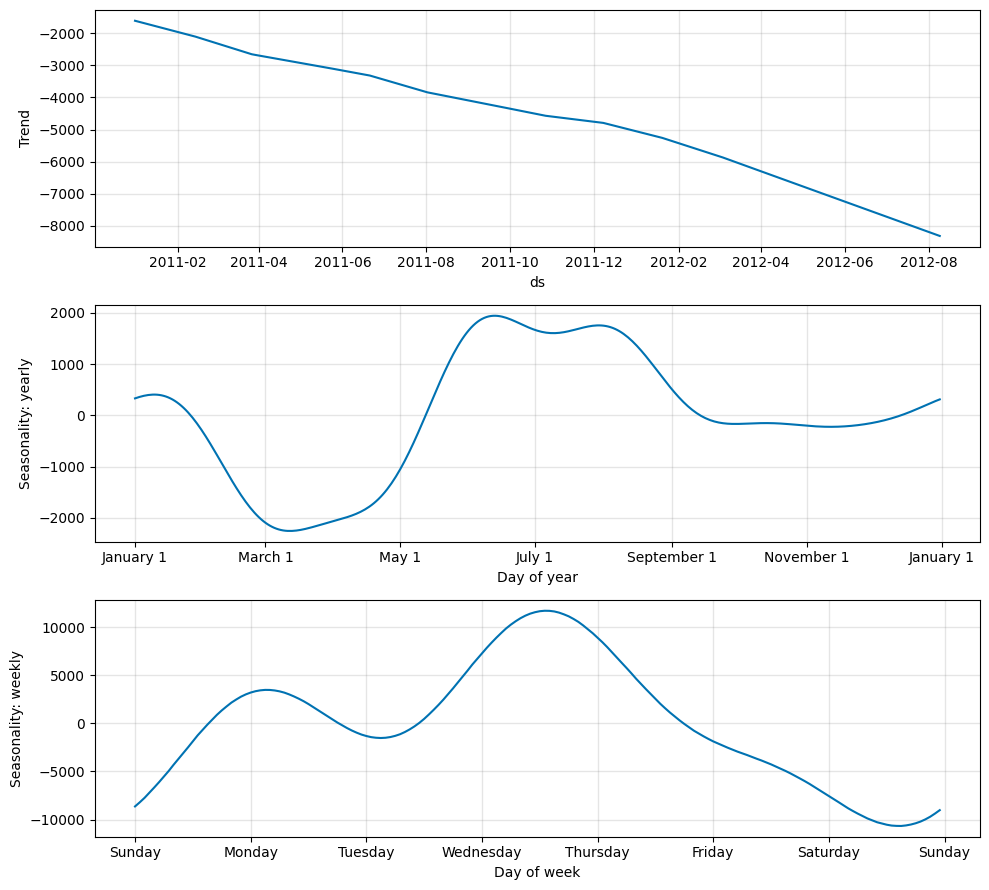

In [84]:
m.plot_parameters(components=["trend","seasonality"])

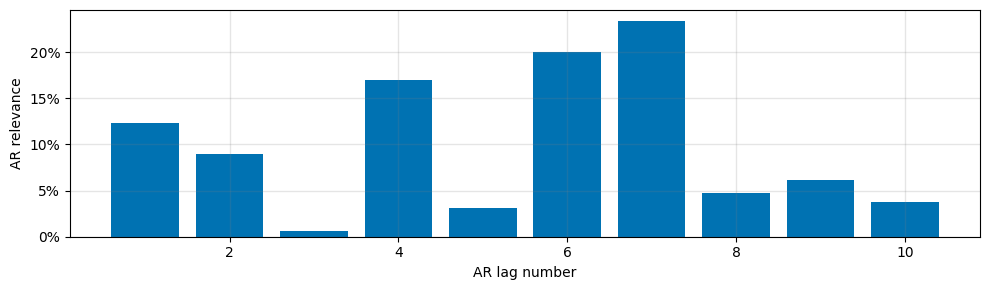

In [85]:
m.plot_parameters(components=["autoregression"])

### AR Experiment 2: hidden layers

In [87]:
# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression and hidden layers
    n_lags=10,
    ar_layers=[8,8]
)
m.set_plotting_backend("matplotlib")  # Use matplotlib

m = m.add_country_holidays("US")

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 656.10it/s]


Epoch 1:   1%|          | 1/140 [00:00<00:00, 2021.35it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 5450.69it/s, loss=4.53, v_num=139, MAE_val=1.12e+4, RMSE_val=1.32e+4, Loss_val=1.490, RegLoss_val=0.000, MAE=1.63e+4, RMSE=1.8e+4, Loss=1.720, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 7332.70it/s, loss=1.34, v_num=139, MAE_val=8.76e+3, RMSE_val=1.09e+4, Loss_val=1.140, RegLoss_val=0.000, MAE=1.26e+4, RMSE=1.42e+4, Loss=1.300, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 9010.32it/s, loss=1.06, v_num=139, MAE_val=7.38e+3, RMSE_val=9.51e+3, Loss_val=0.937, RegLoss_val=0.000, MAE=1.04e+4, RMSE=1.22e+4, Loss=1.040, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 13888.42it/s, loss=0.913, v_num=139, MAE_val=6.41e+3, RMSE_val=8.5e+3, Loss_val=0.794, RegLoss_val=0.000, MAE=9.19e+3, RMSE=1.11e+4, Loss=0.931, RegLoss=0.00

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,991.943787,1453.146973,0.061305,0.0,135,682.334473,916.945801,0.023118,0.0
136,992.503662,1450.402954,0.061153,0.0,136,639.059509,859.941284,0.022162,0.0
137,993.044250,1447.720093,0.061008,0.0,137,647.285583,873.230286,0.022275,0.0
138,993.440002,1445.376953,0.060884,0.0,138,664.161987,888.112854,0.022483,0.0
139,993.922119,1443.357178,0.060786,0.0,139,639.027588,863.071045,0.022073,0.0


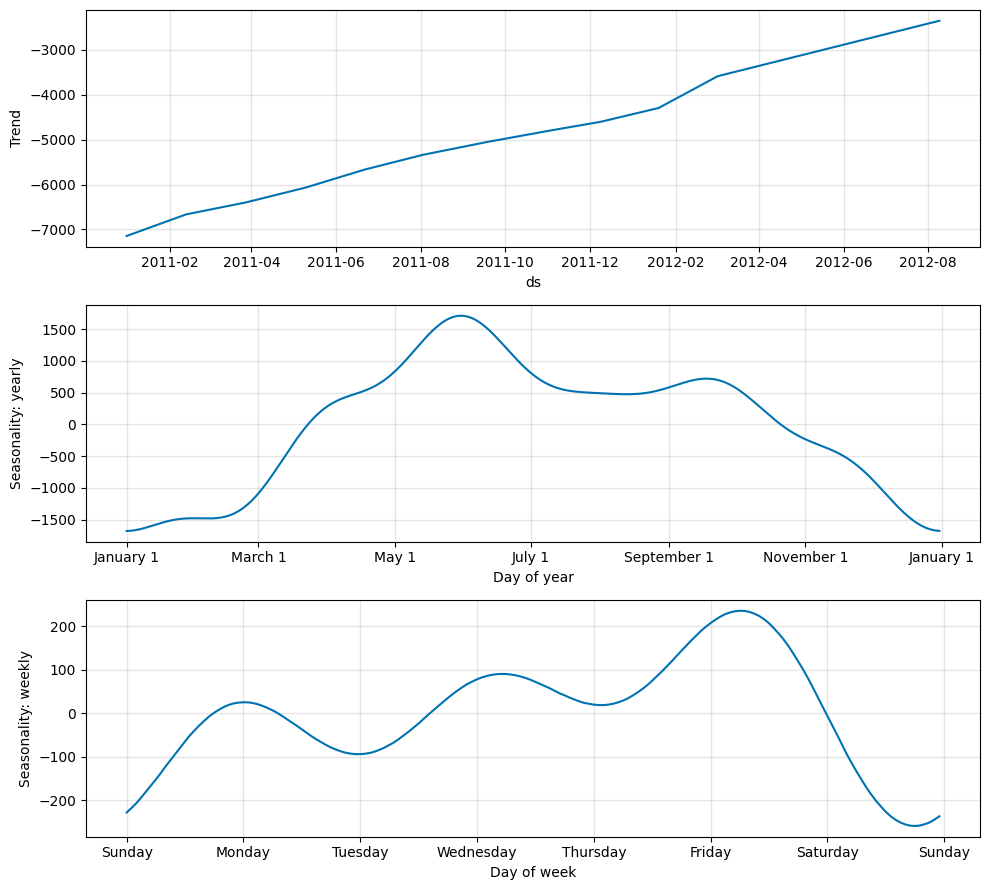

In [88]:
m.plot_parameters(components=["trend","seasonality"])

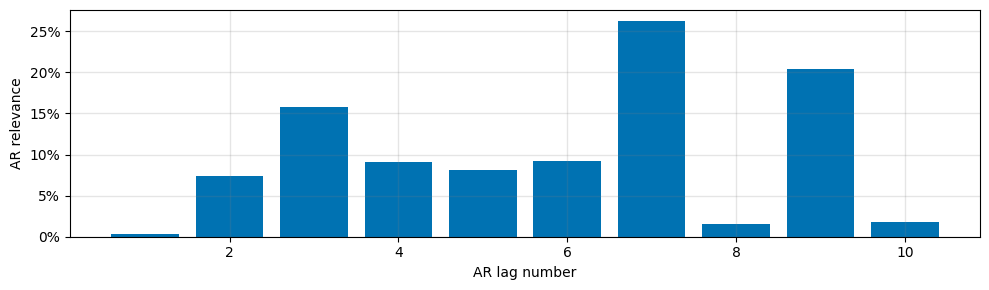

In [89]:
m.plot_parameters(components=["autoregression"])

## Trend + seasonality + holidays + AR + lagged regressors


In [90]:
df2 = data[['ds','cnt','casual']]
df2.columns = ['ds','y','casual']

<Axes: >

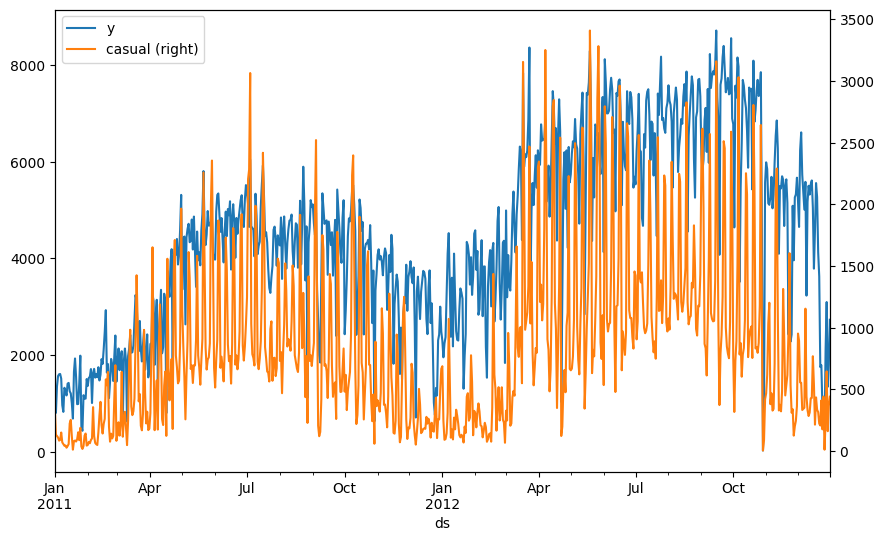

In [91]:
fig = df2.plot(x="ds", y="y", figsize=(10, 6))
df2.plot('ds', 'casual', secondary_y=True, ax=fig)

In [92]:
from neuralprophet import NeuralProphet

# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
)
m = m.add_country_holidays("US")
m.set_plotting_backend("matplotlib")  # Use matplotlib

# Add temperature of last three days as lagged regressor
m.add_lagged_regressor("casual", n_lags=2)

df2_train, df2_test = m.split_df(df2, valid_p=0.2)
metrics = m.fit(df2_train, validation_df=df2_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 685.36it/s]


Epoch 1:   1%|          | 1/140 [00:00<00:00, 1521.88it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 4495.50it/s, loss=4.71, v_num=140, MAE_val=5.8e+3, RMSE_val=6.9e+3, Loss_val=0.707, RegLoss_val=0.000, MAE=6.24e+3, RMSE=7.25e+3, Loss=0.573, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 7125.09it/s, loss=0.45, v_num=140, MAE_val=4.94e+3, RMSE_val=5.94e+3, Loss_val=0.582, RegLoss_val=0.000, MAE=4.86e+3, RMSE=5.77e+3, Loss=0.441, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 7247.18it/s, loss=0.388, v_num=140, MAE_val=4.18e+3, RMSE_val=5.15e+3, Loss_val=0.474, RegLoss_val=0.000, MAE=4.52e+3, RMSE=5.36e+3, Loss=0.408, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 6195.43it/s, loss=0.325, v_num=140, MAE_val=3.59e+3, RMSE_val=4.57e+3, Loss_val=0.389, RegLoss_val=0.000, MAE=3.46e+3, RMSE=4.25e+3, Loss=0.289, RegLoss=0.00

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,865.539062,1239.156250,0.049312,0.0,135,547.527466,745.784241,0.016466,0.0
136,865.990417,1239.248413,0.049323,0.0,136,546.934753,749.856384,0.016429,0.0
137,867.256592,1239.947510,0.049391,0.0,137,566.464417,777.545715,0.017051,0.0
138,869.485291,1242.065308,0.049573,0.0,138,532.530334,735.207153,0.016294,0.0
139,870.773193,1242.116333,0.049599,0.0,139,541.600525,744.955872,0.016316,0.0


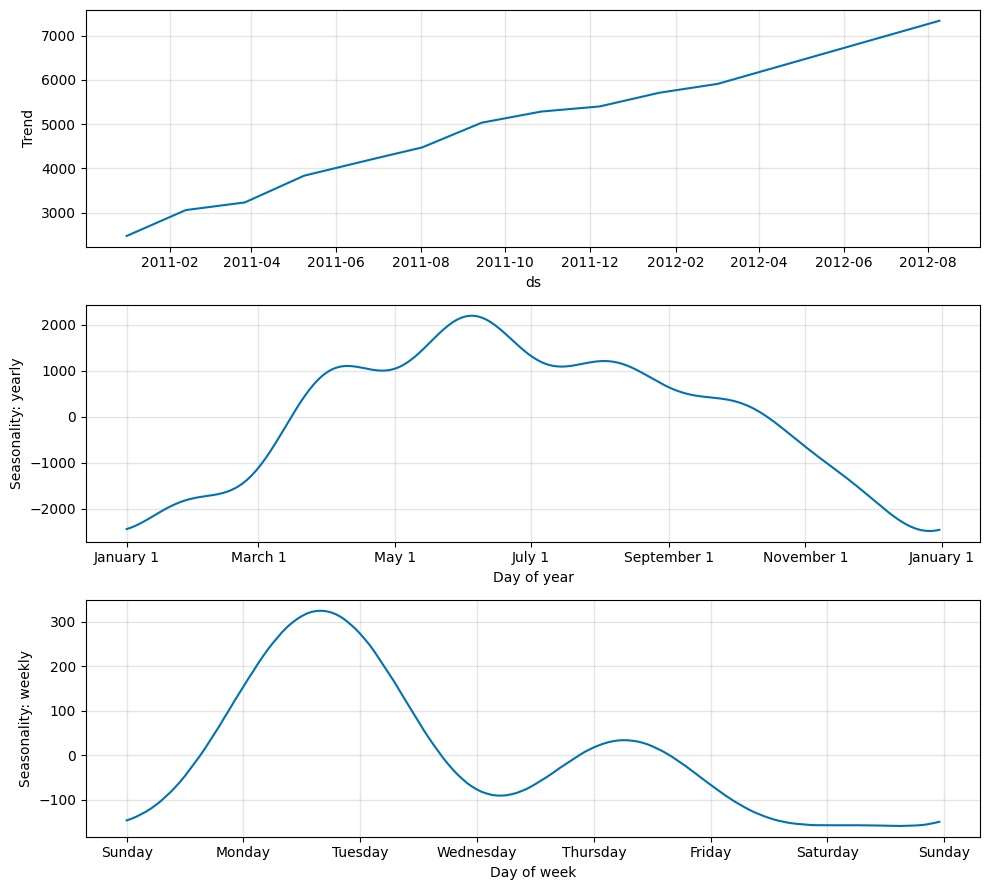

In [93]:
m.plot_parameters(components=["trend","seasonality"])

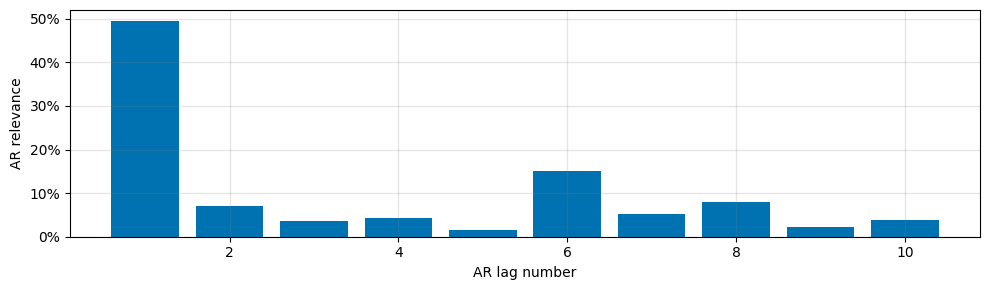

In [94]:
m.plot_parameters(components=["autoregression"])

## Trend + seasonality + holidays + AR + lagged regressors + future regressors

In [95]:
df2 = data[['ds','cnt','temp','casual']]
df2.columns = ['ds','y','temperature','casual']

<Axes: >

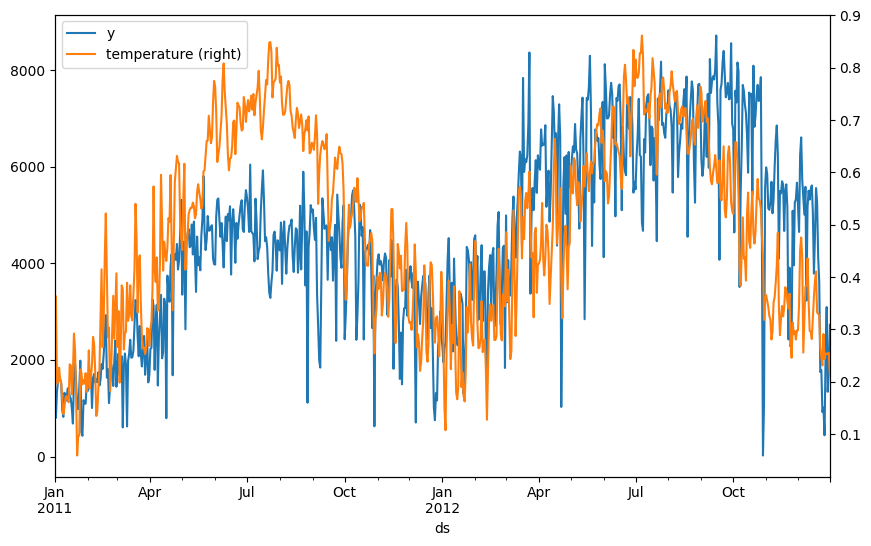

In [96]:
fig = df2.plot(x="ds", y="y", figsize=(10, 6))
df2.plot('ds', 'temperature', secondary_y=True, ax=fig)

In [97]:
# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
)
m = m.add_country_holidays("US")
m.set_plotting_backend("matplotlib")  # Use matplotlib

m.add_lagged_regressor("casual", n_lags=2)

# Add the new future regressor
m.add_future_regressor("temperature")

df2_train, df2_test = m.split_df(df2, valid_p=0.2)
metrics = m.fit(df2_train, validation_df=df2_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 655.57it/s]


Epoch 1:   1%|          | 1/140 [00:00<00:00, 1949.03it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 5127.51it/s, loss=4.91, v_num=141, MAE_val=6.94e+4, RMSE_val=7.3e+4, Loss_val=9.970, RegLoss_val=0.000, MAE=4.12e+4, RMSE=4.87e+4, Loss=4.710, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 5555.37it/s, loss=3.54, v_num=141, MAE_val=4.85e+4, RMSE_val=5.27e+4, Loss_val=6.920, RegLoss_val=0.000, MAE=3.05e+4, RMSE=3.6e+4, Loss=3.540, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 11199.74it/s, loss=2.54, v_num=141, MAE_val=3.26e+4, RMSE_val=3.72e+4, Loss_val=4.610, RegLoss_val=0.000, MAE=2.11e+4, RMSE=2.49e+4, Loss=2.300, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 14169.95it/s, loss=1.68, v_num=141, MAE_val=2.31e+4, RMSE_val=2.69e+4, Loss_val=3.220, RegLoss_val=0.000, MAE=1.6e+4, RMSE=1.83e+4, Loss=1.710, RegLoss=0.000

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,807.535461,1212.613037,0.044934,0.0,135,599.911926,789.068359,0.017693,0.0
136,808.383057,1213.891602,0.045022,0.0,136,559.182861,744.345947,0.016687,0.0
137,808.925659,1213.597656,0.045021,0.0,137,557.935974,747.410583,0.016677,0.0
138,809.070740,1213.443848,0.045023,0.0,138,576.718689,768.156189,0.017010,0.0
139,807.470947,1214.496338,0.045033,0.0,139,567.089783,762.858215,0.016727,0.0


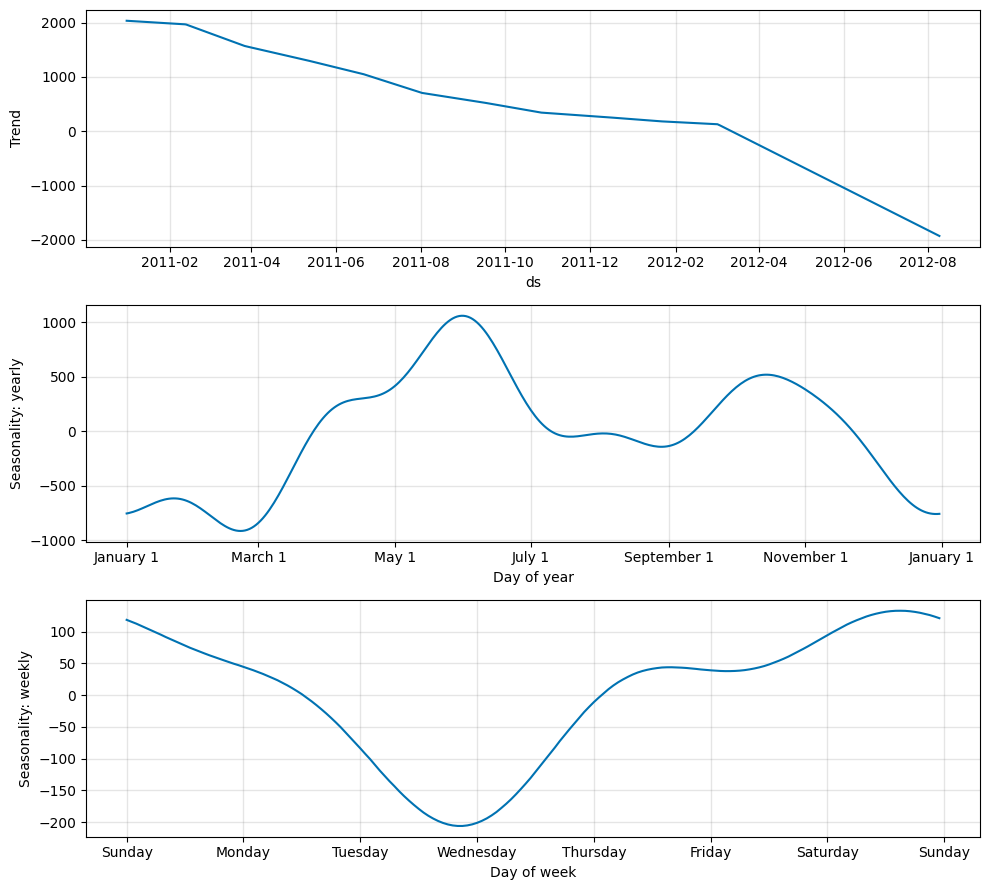

In [98]:
m.plot_parameters(components=["trend","seasonality"])

# Forecast
## Trend + seasonality + holidays + AR

In [100]:
from neuralprophet import NeuralProphet

# Model and prediction
m = NeuralProphet(
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    n_lags=10,
    # Forecast the next 50 days
    n_forecasts= 50
)
m = m.add_country_holidays("US")
m.set_plotting_backend("matplotlib")  # Use matplotlib

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 465.56it/s]


Epoch 1:   1%|          | 1/140 [00:00<00:00, 3226.39it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 3775.25it/s, loss=10.9, v_num=143, MAE_val=1.61e+4, RMSE_val=2.03e+4, Loss_val=2.300, RegLoss_val=0.000, MAE=1.13e+4, RMSE=1.44e+4, Loss=1.220, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 4208.33it/s, loss=0.954, v_num=143, MAE_val=1.2e+4, RMSE_val=1.55e+4, Loss_val=1.680, RegLoss_val=0.000, MAE=8.91e+3, RMSE=1.14e+4, Loss=0.930, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 6907.05it/s, loss=0.745, v_num=143, MAE_val=9.13e+3, RMSE_val=1.19e+4, Loss_val=1.250, RegLoss_val=0.000, MAE=7.06e+3, RMSE=9.08e+3, Loss=0.712, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 6983.52it/s, loss=0.561, v_num=143, MAE_val=7.1e+3, RMSE_val=9.26e+3, Loss_val=0.940, RegLoss_val=0.000, MAE=5.58e+3, RMSE=7.2e+3, Loss=0.541, RegLoss=0.00

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,1329.956665,1578.590454,0.090103,0.0,135,603.734802,831.992432,0.020588,0.0
136,1329.857300,1578.449219,0.090087,0.0,136,603.145813,830.710388,0.020513,0.0
137,1328.835693,1577.470703,0.089973,0.0,137,604.507263,832.993713,0.020655,0.0
138,1328.467773,1577.160767,0.089934,0.0,138,604.130737,833.761353,0.020670,0.0
139,1328.619385,1577.217041,0.089945,0.0,139,604.500916,833.028198,0.020674,0.0


In [101]:
print(df_train.shape)
print(np.max(df_train['ds']))

(558, 2)
2012-07-11 00:00:00


In [102]:
def make_future_data(df,periods):
  timeindex = pd.date_range(start=np.max(df['ds']),periods=periods)
  df2 = pd.DataFrame({'ds':timeindex})
  df_future = df.merge(df2,left_on='ds',right_on='ds', how='outer')
  return(df_future)

df_train_future = make_future_data(df_train,periods=50)
df_train_future.shape

(607, 2)

In [103]:
df_train_future.tail()

,ds,y
602,2012-08-25,NaN
603,2012-08-26,NaN
604,2012-08-27,NaN
605,2012-08-28,NaN
606,2012-08-29,NaN


In [104]:
df_train_forecast = m.predict(df_train_future)

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 78.86it/s]


In [105]:
print(df_train_forecast.shape)
print(df_train_forecast.columns)

(607, 119)
Index(['ds', 'y', 'yhat1', 'yhat2', 'yhat3', 'yhat4', 'yhat5', 'yhat6',
       'yhat7', 'yhat8',
       ...
       'event_Independence Day', 'event_Labor Day',
       'event_Martin Luther King Jr. Day', 'event_Memorial Day',
       'event_New Year's Day', 'event_New Year's Day (observed)',
       'event_Thanksgiving', 'event_Veterans Day',
       'event_Veterans Day (observed)', 'event_Washington's Birthday'],
      dtype='object', length=119)


In [106]:
df_train_forecast.columns[100:150]

Index(['ar49', 'ar50', 'trend', 'season_yearly', 'season_weekly',
       'events_additive', 'event_Christmas Day',
       'event_Christmas Day (observed)', 'event_Columbus Day',
       'event_Independence Day', 'event_Labor Day',
       'event_Martin Luther King Jr. Day', 'event_Memorial Day',
       'event_New Year's Day', 'event_New Year's Day (observed)',
       'event_Thanksgiving', 'event_Veterans Day',
       'event_Veterans Day (observed)', 'event_Washington's Birthday'],
      dtype='object')

In [107]:
dd = df_train_forecast.merge(df_test[['ds','y']],left_on='ds',right_on='ds', how='outer')
dd.shape

(731, 120)

In [108]:
dd

,ds,y_x,yhat1,yhat2,yhat3,yhat4,yhat5,yhat6,yhat7,yhat8,...,event_Labor Day,event_Martin Luther King Jr. Day,event_Memorial Day,event_New Year's Day,event_New Year's Day (observed),event_Thanksgiving,event_Veterans Day,event_Veterans Day (observed),event_Washington's Birthday,y_y
0,2011-01-01,985.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2011-01-02,801.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2011-01-03,1349.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2011-01-04,1562.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2011-01-05,1600.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,2012-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2114.0
727,2012-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3095.0
728,2012-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1341.0
729,2012-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1796.0


Below serves as the code examples for Part 2: 
 - Quantile regression
 - Conformal prediction
 - Conformalized quantile regression

# Quantile regression

In [109]:
from neuralprophet import NeuralProphet
quantile_list=[0.05,0.1,0.5,0.9,0.95 ]
# Model and prediction
m = NeuralProphet(
    quantiles=quantile_list,
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    #n_lags=10,
    # Forecast the next 50 days
    #n_forecasts= 50
)
m = m.add_country_holidays("US")
m.set_plotting_backend("matplotlib")  # Use matplotlib

df_train, df_test = m.split_df(df, valid_p=0.2)
metrics = m.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 662.31it/s]


Epoch 1:   1%|          | 1/130 [00:00<00:00, 2251.37it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   2%|▏         | 2/130 [00:00<00:00, 4495.50it/s, loss=3.63, v_num=144, MAE_val=1.44e+4, RMSE_val=1.48e+4, Loss_val=4.310, RegLoss_val=0.000, MAE=1.37e+4, RMSE=1.44e+4, Loss=3.420, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/130 [00:00<00:00, 5640.03it/s, loss=2.76, v_num=144, MAE_val=1.32e+4, RMSE_val=1.36e+4, Loss_val=3.510, RegLoss_val=0.000, MAE=1.24e+4, RMSE=1.31e+4, Loss=2.720, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/130 [00:00<00:00, 7067.07it/s, loss=2.07, v_num=144, MAE_val=1.18e+4, RMSE_val=1.24e+4, Loss_val=2.760, RegLoss_val=0.000, MAE=1.1e+4, RMSE=1.17e+4, Loss=2.040, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▍         | 5/130 [00:00<00:00, 10843.60it/s, loss=1.47, v_num=144, MAE_val=1.04e+4, RMSE_val=1.11e+4, Loss_val=2.130, RegLoss_val=0.000, MAE=9.71e+3, RMSE=1.05e+4, Loss=1.480, RegLoss=0.00

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
125,1263.786133,1751.944336,0.192197,0.0,125,608.145386,819.917114,0.035264,0.0
126,1265.088013,1751.838501,0.192196,0.0,126,607.943237,815.223022,0.035548,0.0
127,1267.204346,1752.568481,0.192740,0.0,127,613.977478,826.574829,0.035803,0.0
128,1265.319824,1751.672607,0.192625,0.0,128,606.004211,813.281616,0.034996,0.0
129,1266.403442,1754.843140,0.193503,0.0,129,623.316467,829.621826,0.036528,0.0


In [110]:
future = m.make_future_dataframe(df, periods=50, n_historic_predictions=True) #, n_historic_predictions=1)

# Perform prediction with the trained models
forecast = m.predict(df=future)
forecast.tail(60)

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 111.56it/s]


,ds,y,yhat1,yhat1 5.0%,yhat1 10.0%,yhat1 90.0%,yhat1 95.0%,trend,season_yearly,season_weekly,...,event_Independence Day,event_Labor Day,event_Martin Luther King Jr. Day,event_Memorial Day,event_New Year's Day,event_New Year's Day (observed),event_Thanksgiving,event_Veterans Day,event_Veterans Day (observed),event_Washington's Birthday
721,2012-12-22,1749,6000.596191,4292.043945,4292.043945,7507.144531,7507.144531,7295.161133,-1315.979126,21.414171,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
722,2012-12-23,1787,5827.093750,4544.317871,4544.317871,7043.444824,7043.444824,7303.278809,-1309.156006,-167.028625,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
723,2012-12-24,920,5932.609375,4638.158203,4638.158203,7039.401855,7039.401855,7311.395996,-1300.652832,-78.134018,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
724,2012-12-25,1013,4109.393066,3644.689941,3644.689941,4827.654785,4827.654785,7319.513672,-1290.528687,40.322464,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
725,2012-12-26,441,5957.341797,4613.810547,4613.810547,7296.412598,7296.412598,7327.630371,-1278.822388,-91.466301,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
726,2012-12-27,2114,6226.802734,5050.218750,5050.218750,7372.573242,7372.573242,7335.747559,-1265.626587,156.681702,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
727,2012-12-28,3095,6211.310059,4921.182129,4921.182129,7542.184082,7542.184082,7343.865234,-1251.043701,118.488663,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
728,2012-12-29,1341,6138.411133,4408.737305,4408.737305,7668.809570,7668.809570,7351.982422,-1235.144531,21.573406,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
729,2012-12-30,1796,5974.889648,4672.089355,4672.089355,7212.543457,7212.543457,7360.099121,-1218.052246,-167.157043,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
730,2012-12-31,2729,6090.079102,4776.876465,4776.876465,7215.406250,7215.406250,7368.216797,-1199.888916,-78.248375,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000


In [55]:
forecast.columns

Index(['ds', 'y', 'yhat1', 'yhat1 5.0%', 'yhat1 10.0%', 'yhat1 90.0%',
       'yhat1 95.0%', 'trend', 'season_yearly', 'season_weekly',
       'events_additive', 'event_Christmas Day',
       'event_Christmas Day (observed)', 'event_Columbus Day',
       'event_Independence Day', 'event_Labor Day',
       'event_Martin Luther King Jr. Day', 'event_Memorial Day',
       'event_New Year's Day', 'event_New Year's Day (observed)',
       'event_Thanksgiving', 'event_Veterans Day',
       'event_Veterans Day (observed)', 'event_Washington's Birthday'],
      dtype='object')

In [56]:
#!pip install plotly-resampler

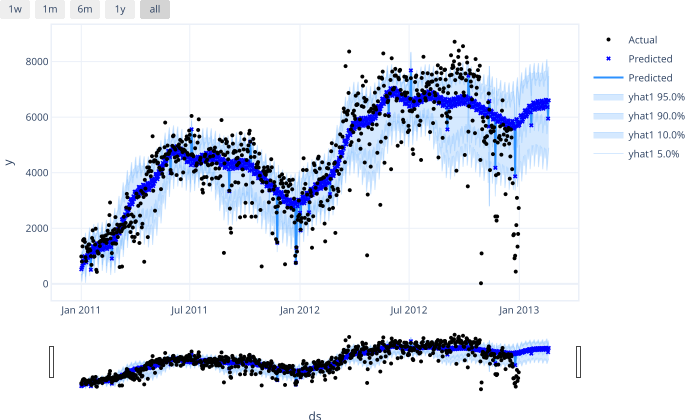

In [57]:
m.highlight_nth_step_ahead_of_each_forecast(1).plot(
    forecast, 
    plotting_backend="plotly-static"
    #plotting_backend = "matplotlib"
)

# Conformal prediction

It involves:
- predict the output value of the instances within the calibration set
- calculate absolute residual by comparing the actual and predicted value for each observation in the calibration set
- sort all absolute residual in ascending order
- finds the quantified uncertainty
- use the quantified uncertainty to make the final prediciton intervals.

In [111]:
cp_model = NeuralProphet(
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    #n_lags=10,
    #learning_rate=0.003  
)
cp_model.set_plotting_backend("plotly-static")

In [112]:
df_train, df_test = cp_model.split_df(df, valid_p=0.2)
df_train, df_cal = cp_model.split_df(df_train, freq="D", valid_p=1.0 / 11)
[df_train.shape, df_test.shape, df_cal.shape]

[(532, 2), (146, 2), (53, 2)]

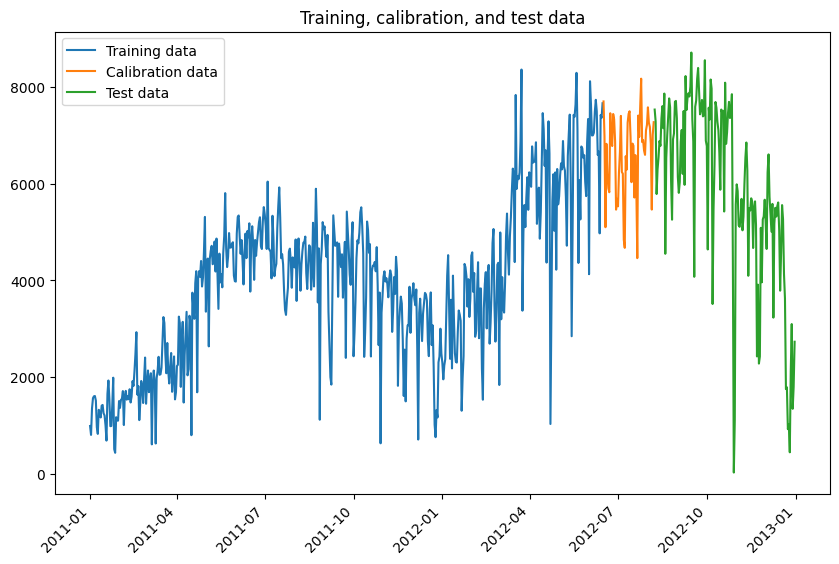

In [113]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,6))
#plot each series
plt.plot(df_train['ds'],df_train['y'],label='Training data')
plt.plot(df_cal['ds'],df_cal['y'],label='Calibration data')
plt.plot(df_test['ds'],df_test['y'],label='Test data')
plt.xticks(rotation=45, ha='right')
plt.title('Training, calibration, and test data')
plt.legend()
plt.show()

In [114]:
metrics = cp_model.fit(df_train, validation_df=df_cal, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 861.58it/s]


Epoch 1:   1%|          | 1/140 [00:00<00:00, 1382.89it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 4683.76it/s, loss=1.03, v_num=145, MAE_val=4.82e+3, RMSE_val=4.98e+3, Loss_val=0.600, RegLoss_val=0.000, MAE=5.48e+3, RMSE=6.48e+3, Loss=0.535, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 6944.21it/s, loss=0.471, v_num=145, MAE_val=4.26e+3, RMSE_val=4.45e+3, Loss_val=0.513, RegLoss_val=0.000, MAE=4.81e+3, RMSE=5.65e+3, Loss=0.453, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 9044.32it/s, loss=0.39, v_num=145, MAE_val=3.61e+3, RMSE_val=3.85e+3, Loss_val=0.414, RegLoss_val=0.000, MAE=4.15e+3, RMSE=4.88e+3, Loss=0.379, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 7851.56it/s, loss=0.314, v_num=145, MAE_val=2.93e+3, RMSE_val=3.25e+3, Loss_val=0.317, RegLoss_val=0.000, MAE=3.54e+3, RMSE=4.13e+3, Loss=0.309, RegLoss=0.

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,715.805054,890.947327,0.031985,0.0,135,608.500000,827.949402,0.022083,0.0
136,715.448608,890.993774,0.031988,0.0,136,605.939087,818.407349,0.021952,0.0
137,717.573059,892.279480,0.032081,0.0,137,612.885071,825.281433,0.022393,0.0
138,719.644592,892.167847,0.032080,0.0,138,608.866516,818.708435,0.022128,0.0
139,719.901184,891.170654,0.032010,0.0,139,606.215332,809.390625,0.021890,0.0


In [115]:
df_cal_residual = cp_model.predict(df_cal)
df_cal_residual['error'] = np.abs(df_cal_residual['y'] - df_cal_residual['yhat1'])
df_cal_residual

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 501.77it/s]


,ds,y,yhat1,trend,season_yearly,season_weekly,error
0,2012-06-16,7702,7040.982910,5475.020996,1470.800537,95.161835,661.017090
1,2012-06-17,6978,6817.441406,5481.174316,1458.809082,-122.542213,160.558594
2,2012-06-18,5099,6784.211914,5487.327148,1445.866577,-148.981735,1685.211914
3,2012-06-19,6825,6945.995117,5493.479980,1432.030884,20.483587,120.995117
4,2012-06-20,6211,6786.623535,5499.633301,1417.398560,-130.408524,575.623535
5,2012-06-21,5905,7040.184082,5505.786621,1402.097412,132.299927,1135.184082
6,2012-06-22,5823,7051.900391,5511.939453,1386.173584,153.787247,1228.900391
7,2012-06-23,7458,6983.114258,5518.092773,1369.731567,95.289635,474.885742
8,2012-06-24,6891,6754.261230,5524.246094,1352.814453,-122.799164,136.738770
9,2012-06-25,6779,6717.227051,5530.399414,1335.573364,-148.745941,61.772949


In [116]:
np.quantile(df_cal_residual['error'],[0.25,0.95,0.975])

array([ 277.56054688, 1848.09482422, 1960.51972656])

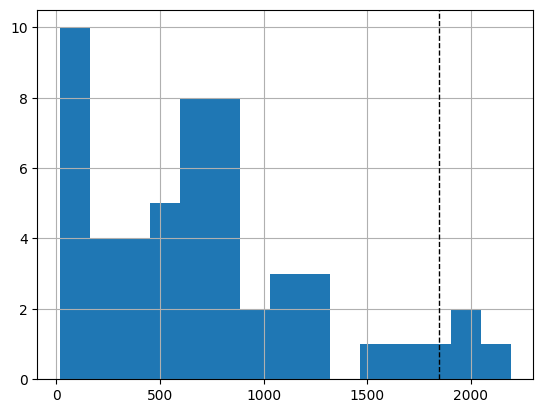

In [117]:
residual_hist = df_cal_residual['error'].hist( bins=15)
threshold = np.percentile(df_cal_residual['error'],95)
plt.axvline(threshold, color='k', linestyle='dashed', linewidth=1)


In [120]:
future = cp_model.make_future_dataframe(df, periods=50, n_historic_predictions=True) #, n_historic_predictions=1)

# Parameter for naive conformal prediction
method = "naive"
alpha = 0.05

# Enable conformal prediction on the pre-trained models
cp_forecast = cp_model.conformal_predict(
    #df_test,
    future,
    calibration_df=df_cal,
    alpha=alpha,
    method=method,
    show_all_PI=True,
)
cp_forecast

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 740.65it/s] 


,ds,y,yhat1,trend,season_yearly,season_weekly,yhat1 + qhat1
0,2011-01-01,985,1049.518311,2711.365723,-1757.101318,95.253952,3028.551025
1,2011-01-02,801,844.187500,2710.512939,-1743.729004,-122.596497,2823.220215
2,2011-01-03,1349,831.791687,2709.660400,-1729.077881,-148.790817,2810.824463
3,2011-01-04,1562,1015.992676,2708.807617,-1713.306396,20.491571,2995.025391
4,2011-01-05,1600,880.959473,2707.954834,-1696.548462,-130.446991,2859.992188
...,...,...,...,...,...,...,...
776,2013-02-15,None,6069.497070,6976.383301,-1060.775879,153.889328,8048.529785
777,2013-02-16,None,6041.055664,6982.536621,-1037.000122,95.519112,8020.088379
778,2013-02-17,None,5854.556152,6988.689941,-1011.241150,-122.892410,7833.588867
779,2013-02-18,None,5862.515137,6994.842285,-983.653015,-148.674332,7841.547852


In [121]:
cp_forecast['qhat1'] = cp_forecast['yhat1 + qhat1'] - cp_forecast['yhat1'] 
cp_forecast['yhat1 - qhat1'] = cp_forecast['yhat1'] - cp_forecast['qhat1']
cp_forecast['qhat1']

0      1979.032715
1      1979.032715
2      1979.032715
3      1979.032715
4      1979.032715
          ...     
776    1979.032715
777    1979.032715
778    1979.032715
779    1979.032715
780    1979.032715
Name: qhat1, Length: 781, dtype: float32

In [122]:
cp_forecast

,ds,y,yhat1,trend,season_yearly,season_weekly,yhat1 + qhat1,qhat1,yhat1 - qhat1
0,2011-01-01,985,1049.518311,2711.365723,-1757.101318,95.253952,3028.551025,1979.032715,-929.514404
1,2011-01-02,801,844.187500,2710.512939,-1743.729004,-122.596497,2823.220215,1979.032715,-1134.845215
2,2011-01-03,1349,831.791687,2709.660400,-1729.077881,-148.790817,2810.824463,1979.032715,-1147.240967
3,2011-01-04,1562,1015.992676,2708.807617,-1713.306396,20.491571,2995.025391,1979.032715,-963.040039
4,2011-01-05,1600,880.959473,2707.954834,-1696.548462,-130.446991,2859.992188,1979.032715,-1098.073242
...,...,...,...,...,...,...,...,...,...
776,2013-02-15,None,6069.497070,6976.383301,-1060.775879,153.889328,8048.529785,1979.032715,4090.464355
777,2013-02-16,None,6041.055664,6982.536621,-1037.000122,95.519112,8020.088379,1979.032715,4062.022949
778,2013-02-17,None,5854.556152,6988.689941,-1011.241150,-122.892410,7833.588867,1979.032715,3875.523438
779,2013-02-18,None,5862.515137,6994.842285,-983.653015,-148.674332,7841.547852,1979.032715,3883.482422


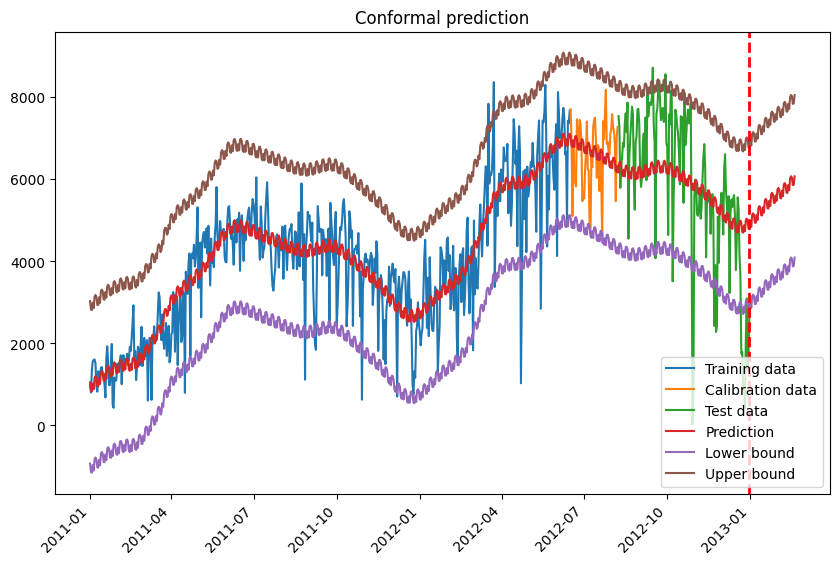

In [123]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,6))
#plot each series
plt.plot(df_train['ds'],df_train['y'], label='Training data')
plt.plot(df_cal['ds'],df_cal['y'], label='Calibration data')
plt.plot(df_test['ds'],df_test['y'], label='Test data')
plt.plot(cp_forecast['ds'],cp_forecast['yhat1'], label='Prediction')
plt.plot(cp_forecast['ds'],cp_forecast['yhat1 - qhat1'], label='Lower bound')
plt.plot(cp_forecast['ds'],cp_forecast['yhat1 + qhat1'], label='Upper bound')
plt.legend()
plt.title('Conformal prediction')
plt.xticks(rotation=45, ha='right')
plt.axvline(x=df_test['ds'].tail(1), color='r', linestyle='--', linewidth=2) # Draw a vertical dashed line
plt.show()

# Conformallized quantile regression
Conformalized Quantile Regression runs as follows:
- calculate non-conformity scores as the differences between data points from the calibration dataset and their nearest prediction quantile, which provides a measure of how well the data fits the current quantile regression model. The non-conformity scores are negative for data points within the quantile regression interval and positive if they are outside the interval;
- sort list of non-conformity scores;
- find the value of such that the portion of scores in the list greater than is equal to that error rate; and
- adjust the quantiles from the regression model. 

In [124]:
from neuralprophet import NeuralProphet
quantile_list=[0.05,0.95 ]
# Model and prediction
cqr_model = NeuralProphet(
    quantiles=quantile_list,
    #n_changepoints=10,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    # Add the autogression
    #n_lags=10,
    # Forecast the next 50 days
    #n_forecasts= 50
)
cqr_model = cqr_model.add_country_holidays("US")
#cqr_model.set_plotting_backend("matplotlib")  # Use matplotlib

In [125]:
metrics = cqr_model.fit(df_train, validation_df=df_test, progress="bar")
metrics.tail()

Finding best initial lr: 100%|██████████| 220/220 [00:00<00:00, 717.74it/s]


Epoch 1:   1%|          | 1/140 [00:00<00:00, 1703.62it/s]
Validation: 0it [00:00, ?it/s]
Epoch 2:   1%|▏         | 2/140 [00:00<00:00, 4917.12it/s, loss=2.2, v_num=146, MAE_val=5.24e+3, RMSE_val=6.3e+3, Loss_val=2.720, RegLoss_val=0.000, MAE=4.17e+3, RMSE=5.11e+3, Loss=2.000, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 3:   2%|▏         | 3/140 [00:00<00:00, 5182.42it/s, loss=1.56, v_num=146, MAE_val=3.62e+3, RMSE_val=4.27e+3, Loss_val=2.240, RegLoss_val=0.000, MAE=2.83e+3, RMSE=3.5e+3, Loss=1.530, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 4:   3%|▎         | 4/140 [00:00<00:00, 7194.35it/s, loss=1.22, v_num=146, MAE_val=1.82e+3, RMSE_val=2.19e+3, Loss_val=1.850, RegLoss_val=0.000, MAE=1.76e+3, RMSE=2.16e+3, Loss=1.190, RegLoss=0.000]
Validation: 0it [00:00, ?it/s]
Epoch 5:   4%|▎         | 5/140 [00:00<00:00, 9650.95it/s, loss=0.93, v_num=146, MAE_val=1.23e+3, RMSE_val=1.66e+3, Loss_val=1.530, RegLoss_val=0.000, MAE=1.07e+3, RMSE=1.38e+3, Loss=0.903, RegLoss=0.000]


,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
135,1174.843262,1488.324707,0.123173,0.0,135,583.919312,809.739685,0.028648,0.0
136,1175.855469,1486.832886,0.123745,0.0,136,584.888123,793.665466,0.028737,0.0
137,1180.873657,1489.901245,0.125135,0.0,137,583.319519,807.415039,0.028743,0.0
138,1173.756714,1488.003662,0.123344,0.0,138,587.573669,815.066162,0.028665,0.0
139,1175.040405,1489.214355,0.123828,0.0,139,587.445312,812.867432,0.028627,0.0


In [126]:
future = cqr_model.make_future_dataframe(df, periods=50, n_historic_predictions=True) #, n_historic_predictions=1)

# Parameter for Conformalized Quantile Regression
method = "cqr"

# Enable conformal predict on the pre-trained models
# Evaluate parameter is optional, refer to the "Evaluate Performance" session below
cqr_forecast = cqr_model.conformal_predict(
    #df_test,
    future,
    calibration_df=df_cal, alpha=alpha, method=method
)

Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 479.84it/s]


In [127]:
cqr_forecast

,ds,y,yhat1,yhat1 5.0%,yhat1 95.0%,trend,season_yearly,season_weekly,events_additive,event_Christmas Day,...,event_Independence Day,event_Labor Day,event_Martin Luther King Jr. Day,event_Memorial Day,event_New Year's Day,event_New Year's Day (observed),event_Thanksgiving,event_Veterans Day,event_Veterans Day (observed),event_Washington's Birthday
0,2011-01-01,985,941.761292,106.057678,1843.868652,3041.950195,-1784.661987,78.386032,-393.913086,0.0,...,0.0,0.0,0.0,0.0,-393.913086,0.0,0.0,0.0,0.0,0.000000
1,2011-01-02,801,1151.272705,161.456665,2383.437988,3033.308350,-1776.213257,-105.822395,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
2,2011-01-03,1349,1166.734619,316.513306,2262.303711,3024.666260,-1766.521484,-91.410103,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
3,2011-01-04,1562,1244.909424,409.205811,2480.951172,3016.024170,-1755.734131,-15.380549,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
4,2011-01-05,1600,1119.326172,114.863220,2401.534912,3007.382324,-1743.935181,-144.121140,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
776,2013-02-15,None,5684.973633,-439.449036,7044.319336,6682.047363,-1130.508301,133.434601,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
777,2013-02-16,None,5661.370117,-970.765381,7278.714844,6687.074707,-1104.318848,78.614586,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
778,2013-02-17,None,5509.786133,-682.502197,6796.729004,6692.102051,-1076.220581,-106.095551,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
779,2013-02-18,None,5067.152344,-243.099731,5957.694824,6697.128906,-1046.410400,-91.345207,-492.221161,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,-492.221161


In [128]:
cqr_forecast.columns

Index(['ds', 'y', 'yhat1', 'yhat1 5.0%', 'yhat1 95.0%', 'trend',
       'season_yearly', 'season_weekly', 'events_additive',
       'event_Christmas Day', 'event_Christmas Day (observed)',
       'event_Columbus Day', 'event_Independence Day', 'event_Labor Day',
       'event_Martin Luther King Jr. Day', 'event_Memorial Day',
       'event_New Year's Day', 'event_New Year's Day (observed)',
       'event_Thanksgiving', 'event_Veterans Day',
       'event_Veterans Day (observed)', 'event_Washington's Birthday'],
      dtype='object')

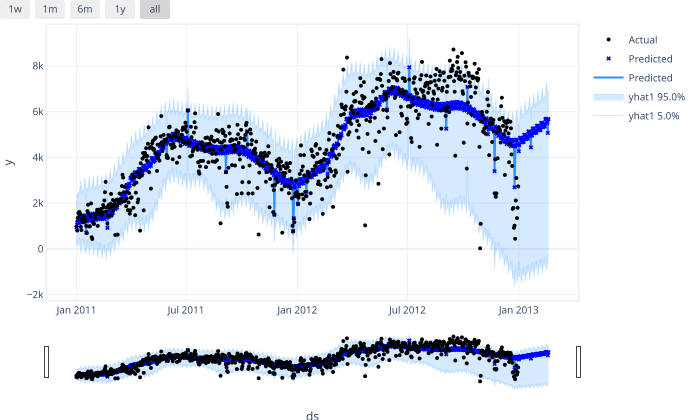

In [129]:
fig = cqr_model.highlight_nth_step_ahead_of_each_forecast(1).plot(cqr_forecast, 
    #plotting_backend = "matplotlib"
    plotting_backend="plotly-static"
)

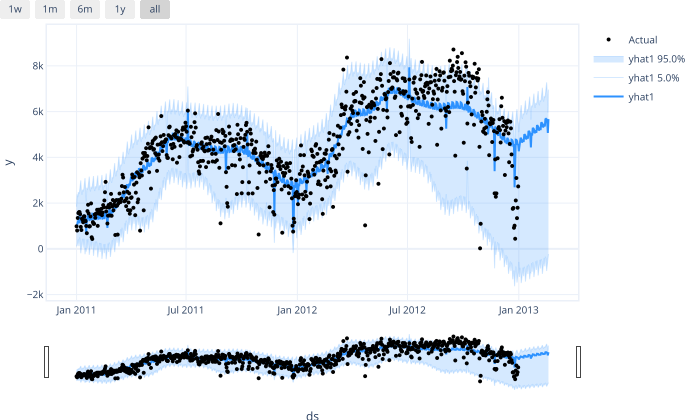

In [130]:
fig = cqr_model.plot(cqr_forecast, 
    #plotting_backend = "matplotlib"
    plotting_backend="plotly-static"
)